In [1]:
import warnings
warnings.filterwarnings("ignore")

import cla.metrics
import numpy as np

print('--- use these metrics to compare and evaluate kernels ---')
cla.metrics.metrics_keys()

Unable to determine R home: [WinError 2] The system cannot find the file specified


rpy2 3.X may not support Windows. ECoL metrics may not be available.
--- use these metrics to compare and evaluate kernels ---


Exception ignored from cffi callback <function _consolewrite_ex at 0x000001ED0D08FEE0>:
Traceback (most recent call last):
  File "C:\Users\eleve\anaconda3\lib\site-packages\rpy2\rinterface_lib\callbacks.py", line 133, in _consolewrite_ex
    s = conversion._cchar_to_str_with_maxlen(buf, n, _CCHAR_ENCODING)
  File "C:\Users\eleve\anaconda3\lib\site-packages\rpy2\rinterface_lib\conversion.py", line 138, in _cchar_to_str_with_maxlen
    s = ffi.string(c, maxlen).decode(encoding)
UnicodeDecodeError: 'utf-8' codec can't decode byte 0xd4 in position 0: invalid continuation byte


['classification.ACC',
 'classification.Kappa',
 'classification.F1_Score',
 'classification.Jaccard',
 'classification.Precision',
 'classification.Recall',
 'classification.McNemar',
 'classification.McNemar.CHI2',
 'classification.CochranQ',
 'classification.CochranQ.T',
 'classification.CrossEntropy',
 'classification.Mean_KLD',
 'classification.Brier',
 'classification.ROC_AUC',
 'classification.PR_AUC',
 'classification.BER',
 'classification.SVM.Margin',
 'correlation.IG',
 'correlation.IG.max',
 'correlation.r',
 'correlation.r2',
 'correlation.r.p',
 'correlation.r.max',
 'correlation.r2.max',
 'correlation.r.p.min',
 'correlation.rho',
 'correlation.rho.p',
 'correlation.rho.max',
 'correlation.rho.p.min',
 'correlation.tau',
 'correlation.tau.p',
 'correlation.tau.max',
 'correlation.tau.p.min',
 'test.ES',
 'test.ES.max',
 'test.student',
 'test.student.min',
 'test.student.min.log10',
 'test.student.T',
 'test.student.T.max',
 'test.ANOVA',
 'test.ANOVA.min',
 'test.ANOVA.

# Kernel Types

Let's try different kernel types.

## Response Pattern

Show how each kernel varies with pairwise-point-distances.

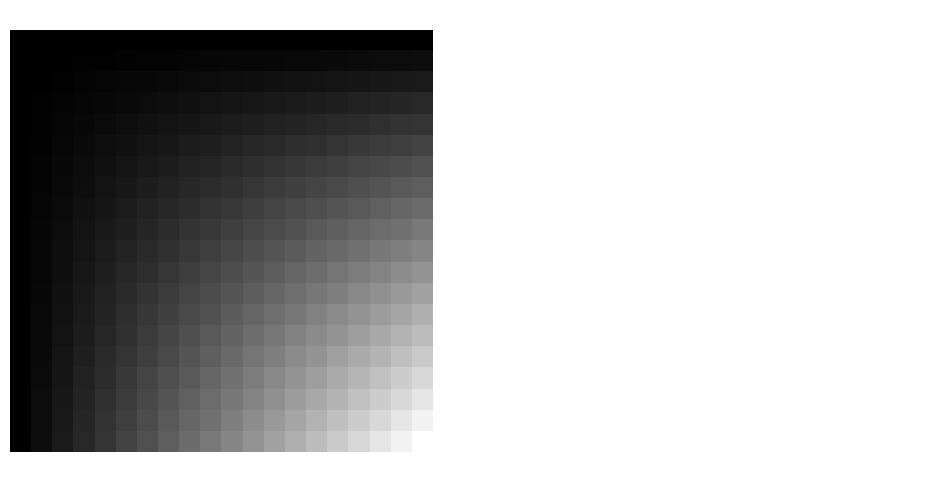

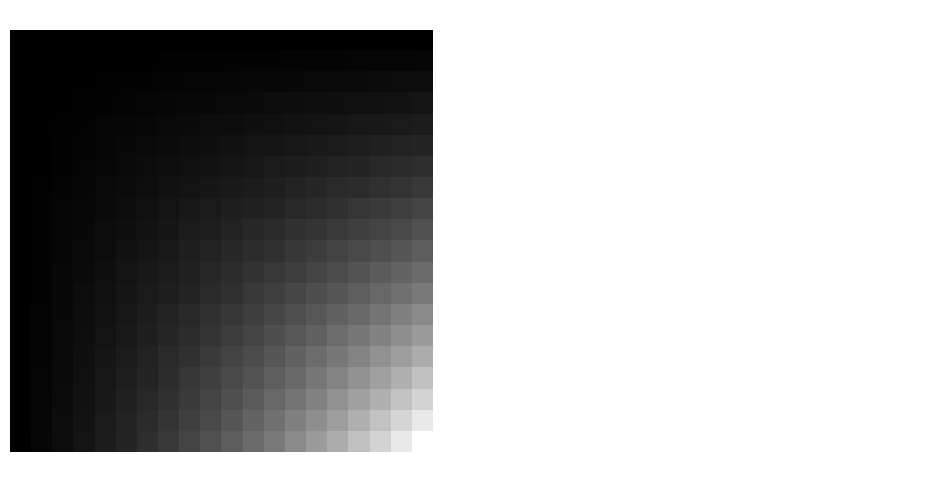

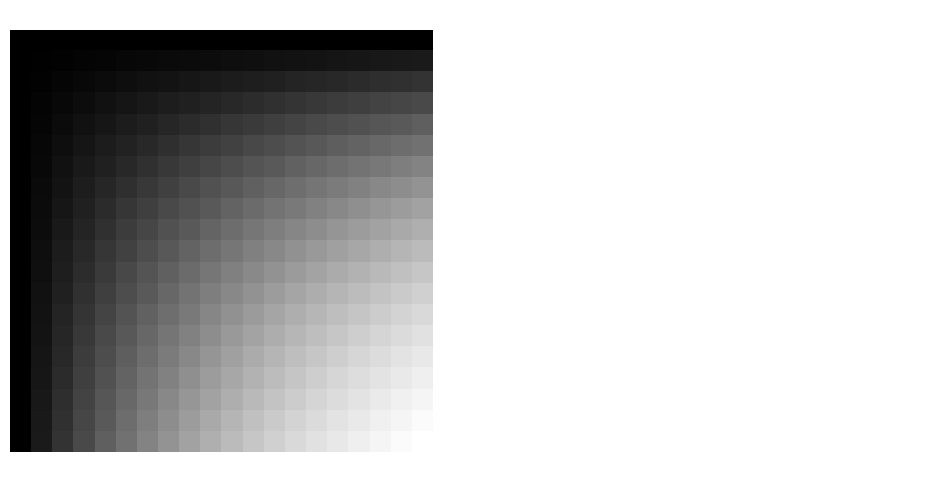

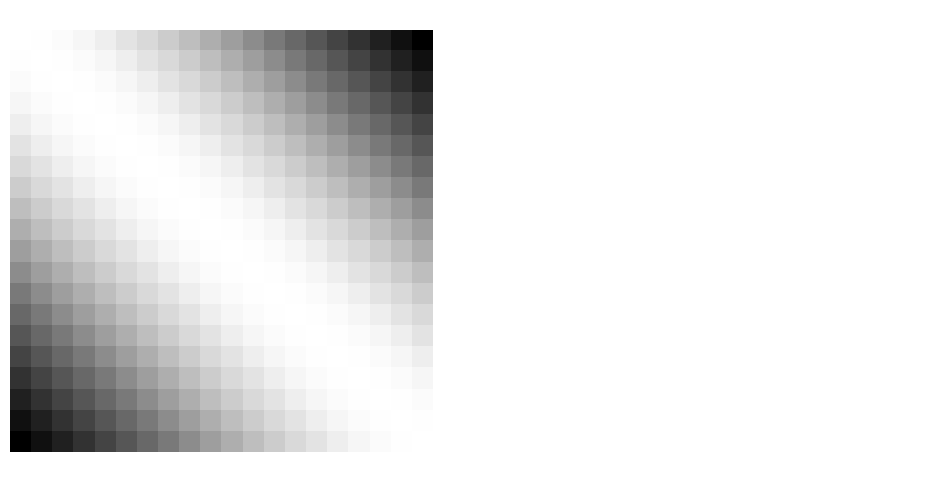

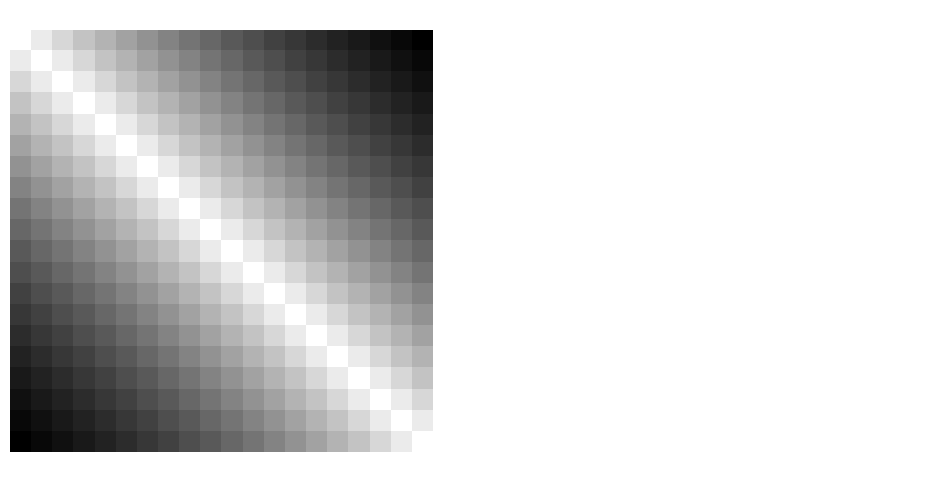

...

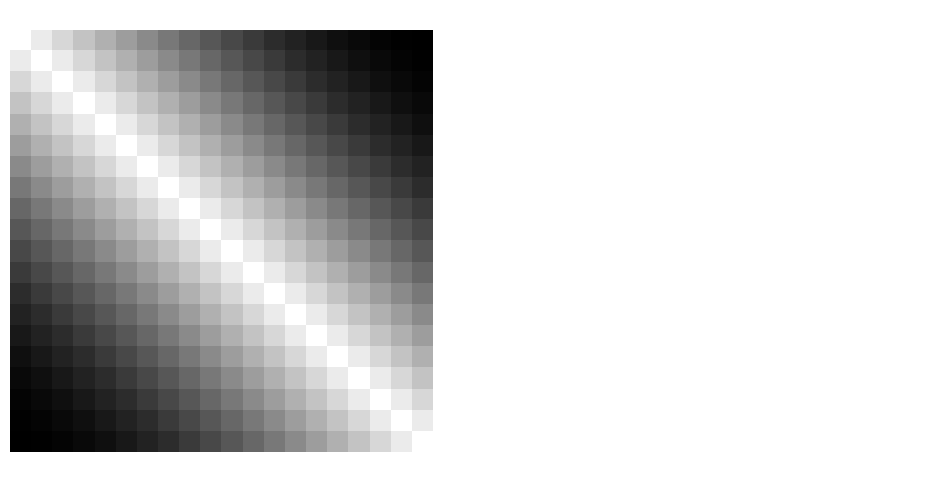

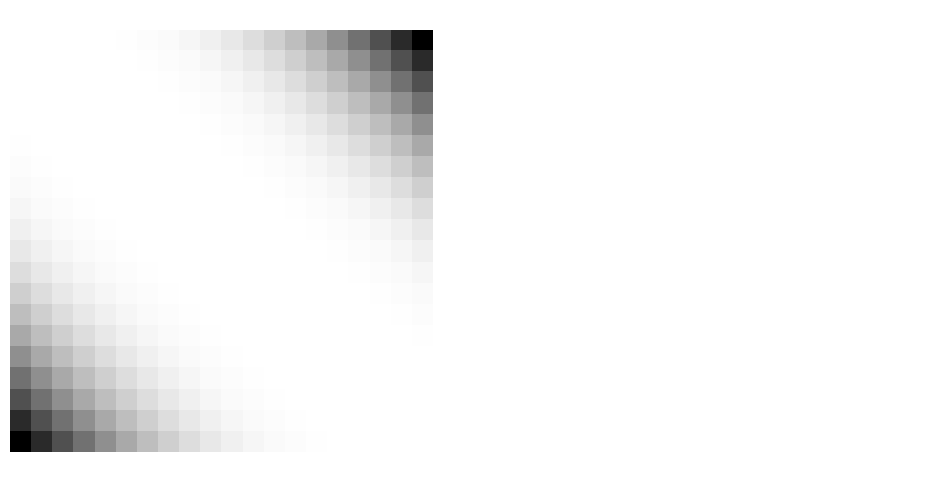

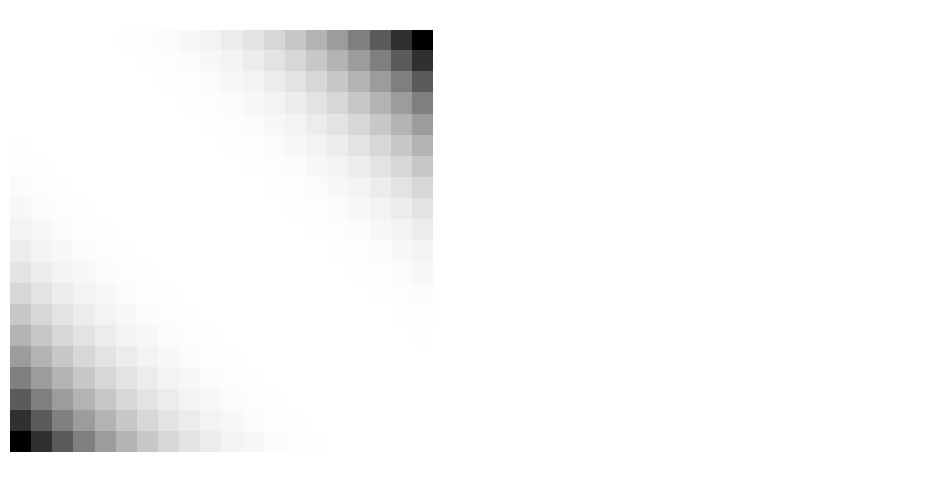

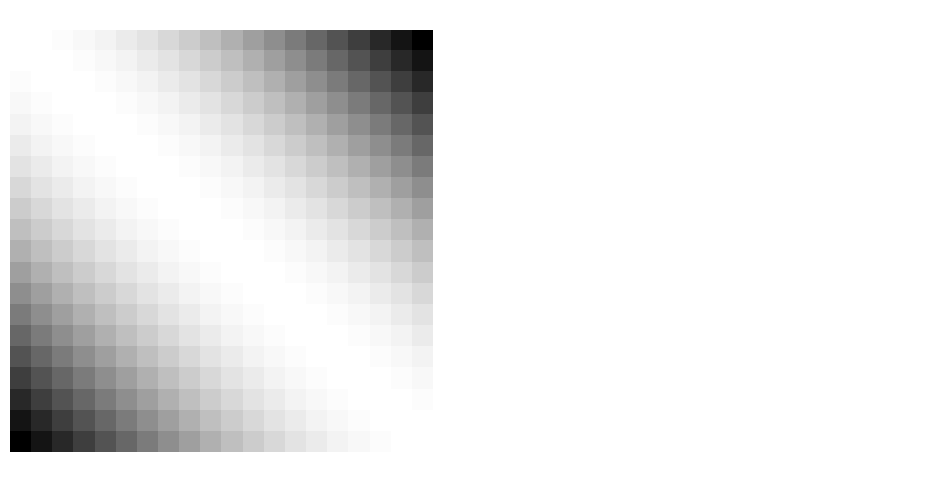

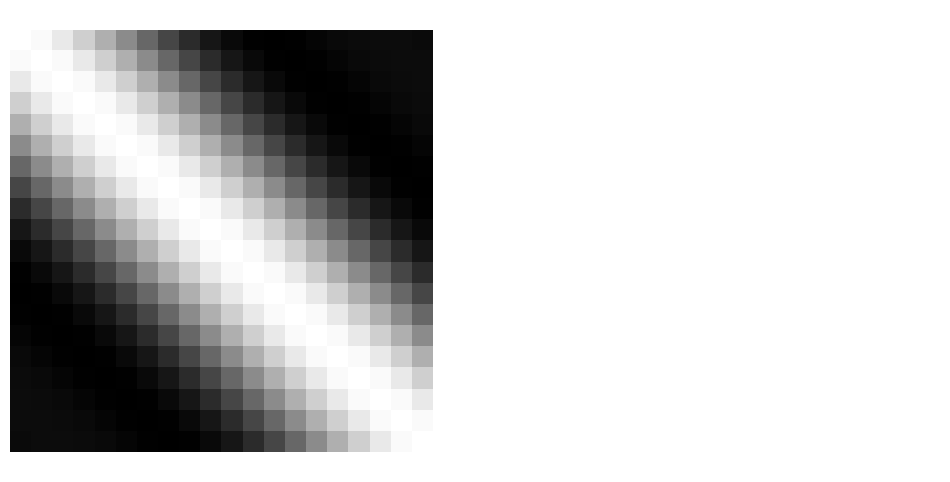

In [2]:
import ackl.metrics

ackl.metrics.linear_response_pattern(20)

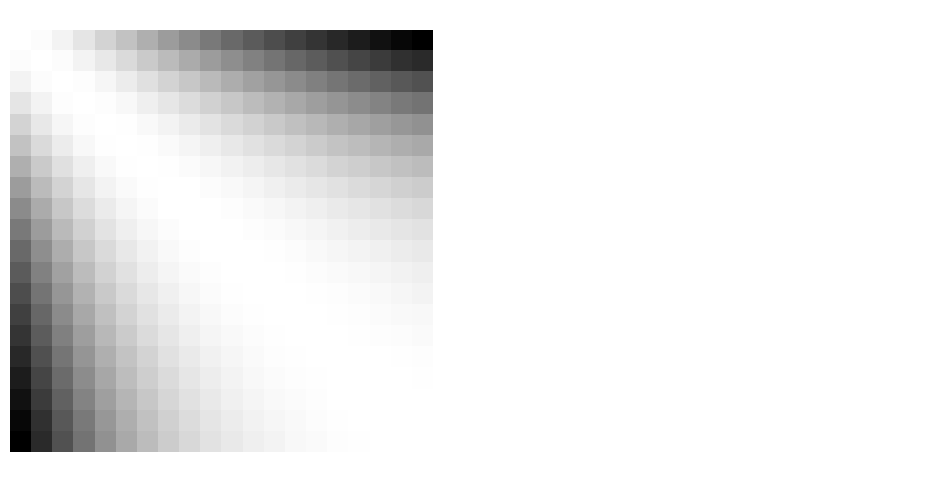

In [3]:
ackl.metrics.cosine_kernel_response_pattern(n = 20, cmap = 'gray', logplot = False, embed_title = False)

## Binary Response Pattern

       0      1 
    0  k(0,0) k(0,1)
    1  k(1,0) k(1,1)

# Real Dataset Experiments

In [4]:
from qsi import io
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import ackl.metrics
import cla.metrics
import pickle
import ackl
from IPython.core.display import HTML, display
import os.path
from sklearn.decomposition import PCA
    
def analyze_dataset(id):
    display(HTML('<h1>' + id + '</h1><hr/><br/>'))
    
    if id == 'shihu':
        X, y, X_names, desc, labels = io.load_dataset('shihu_c2', shift = 500, display=True)
    elif id == 'salt':
        X, y, X_names, desc, labels = io.load_dataset('salt', x_range = list(range(400,1000)), shift = 200, display=True)
    elif id == 'huangjing':
        X, y, X_names, desc, labels = io.load_dataset('huangjing2', x_range=list(range(400, 1300)), shift = 2000, display=True)
    elif id == 'vintage':
        X, y, X_names, desc, labels = io.load_dataset('vintage_spi', x_range=list(range(3000)), y_subset = [0,3], display=True) 
    else:
        X, y, X_names, desc, labels = io.load_dataset(id)

    _, ms = cla.metrics.get_metrics(X, y)
        
    old_dim = X.shape
    X = PCA(n_components = 0.99).fit_transform(X) # DR to 99% PCA components
    new_dim = X.shape
        
    for pre in ['mm']: # some kernels require non-negative input
        
        pre_desc = ''
    
        if pre == 'mm':
            X = MinMaxScaler().fit_transform(X) 
            pre_desc = 'sklearn.preprocessing.MinMaxScaler'
        elif pre == 'norm':
            X = StandardScaler().fit_transform(X)
            pre_desc = 'sklearn.preprocessing.StandardScaler'
        else:
            pre_desc = 'no preprocessing. use original data.'

        display(HTML('<h2>1. Preprocessing</h2><hr/><p>' + '1.1 PCA: ' + str(old_dim) + ' ==> ' + str(new_dim) + '</p><p>1.2 Feature scaling: ' + pre_desc + '</p><br/>'))
        
        # display(HTML('<h2>2. CLA before kernel' + '</h2><hr/><br/>'))        
        # display(HTML('<p>' + str(ms) + '</p>'))
        
        display(HTML('<h2>2. Try Kernels' + '</h2><hr/><br/>'))
        
        pkl = id + '_' + pre + '_' + ackl.__version__ + '.pkl'
        if not os.path.isfile(pkl): # if pkl already exist, just reload it
        
            dics = ackl.metrics.preview_kernels(X, y,embed_title = False, scale = False, logplot = False)

            # Persist to a local pickle binary file.
            with open(pkl,'wb') as f:
                pickle.dump(dics, f)

        # Load back
        with open (pkl, 'rb') as f:
            dics = pickle.load(f)
        
        display(HTML('<h2>3. Evaluate Metrics' + '</h2><hr/><br/>'))
        html_str = ackl.metrics.visualize_metric_dicts(dics, plot = True)
        display(HTML( html_str ))
        
    display(HTML('<h2>4. Run time' + '</h2><hr/><br/>'))
    dic = ackl.metrics.time_cost_kernels(X, repeat=10)
    print('Averaged run time: ', dic)
        
    display(HTML('<h3>----------- End of Analysis ----------</h3><br/><br/>'))

load dataset from 7545.csv
X.shape (120, 600)  y.shape (120,)


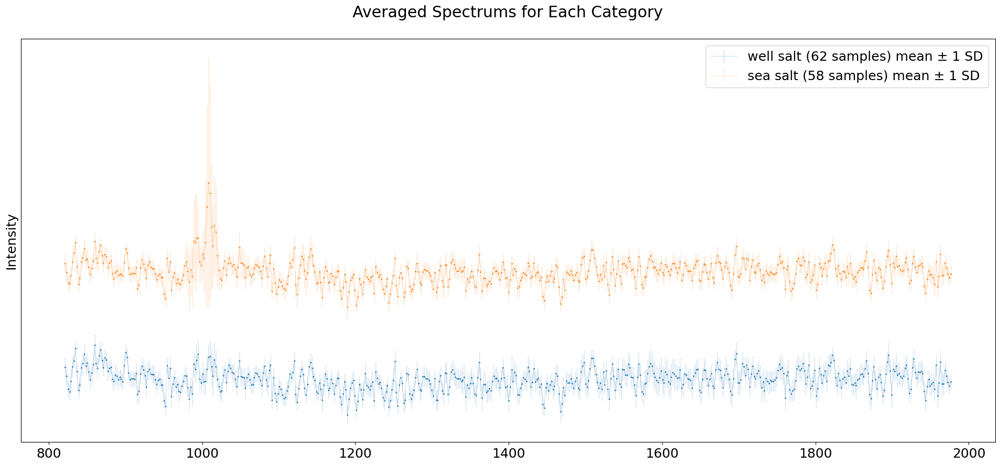

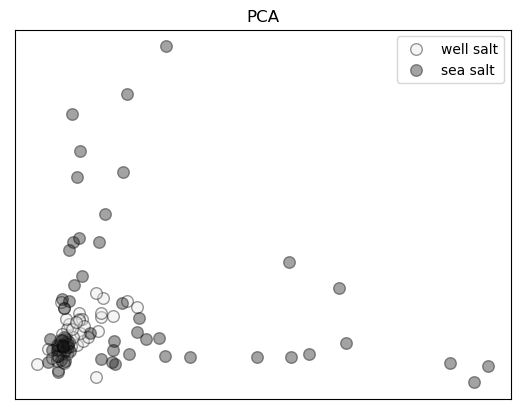

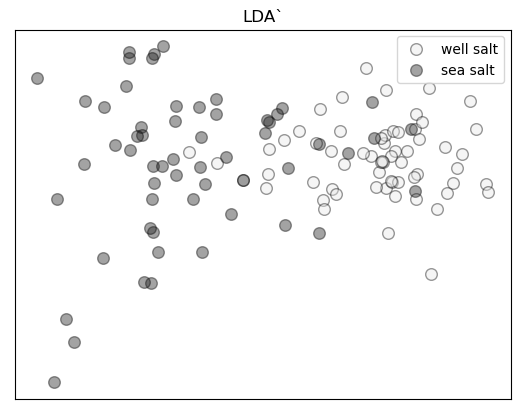

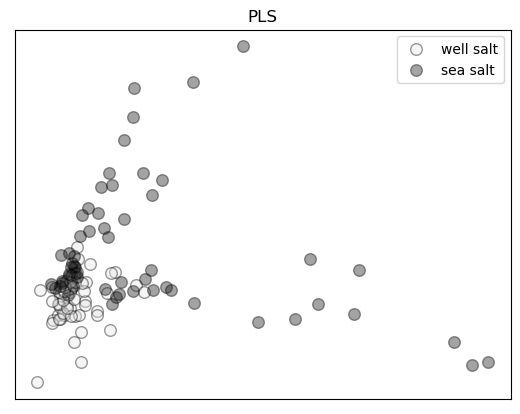

食盐拉曼光谱

C1 - "shenjinkuangyan(zhongyan)：深井矿盐（中盐集团）加碘盐", 
“deep well mineral salt” from CNSIC (China National Salt Industry Co.,Ltd).

C2 - "aozhoutianranhaiyan(huaiyan)：澳洲天然海盐（淮盐）未加碘",
“Australian natural sea salt” from Suyan Group.

DXR2xi显微拉曼成像光谱仪（美国Thermo Fisher公司），
配备有532 nm激光器。
仪器参数设置：
激光功率为10 mw，曝光时间1 s，扫描次数500，
拉曼位移范围为100～3000 cm-1。


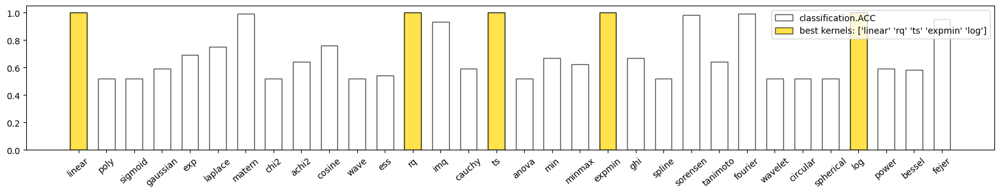

classification.ACC
best kernels: ['linear' 'rq' 'ts' 'expmin' 'log']
best value: 1.0


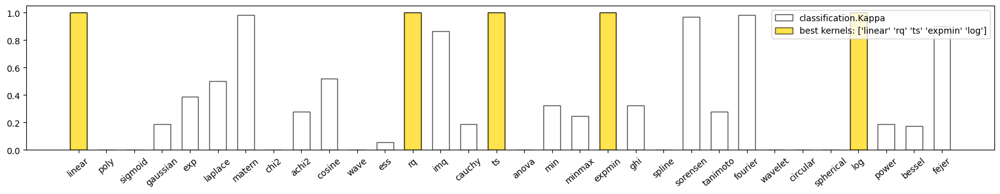

classification.Kappa
best kernels: ['linear' 'rq' 'ts' 'expmin' 'log']
best value: 1.0


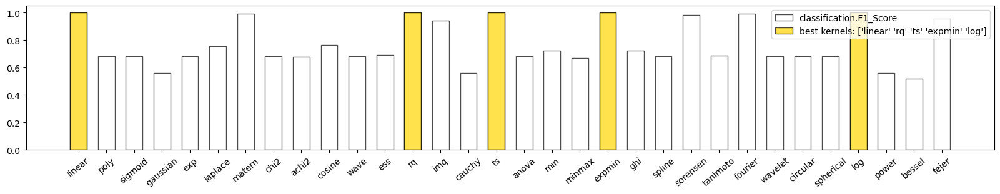

classification.F1_Score
best kernels: ['linear' 'rq' 'ts' 'expmin' 'log']
best value: 1.0


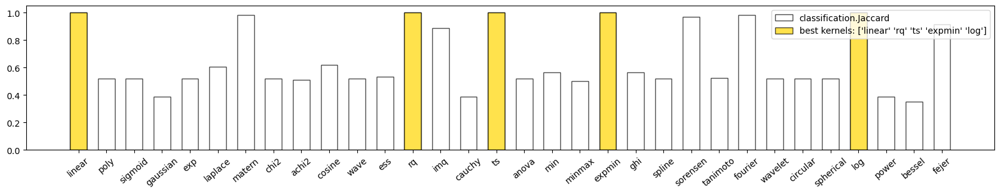

classification.Jaccard
best kernels: ['linear' 'rq' 'ts' 'expmin' 'log']
best value: 1.0


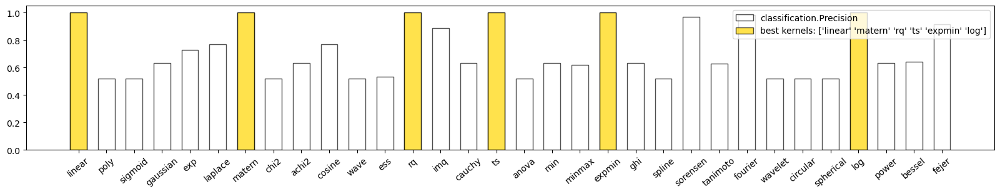

classification.Precision
best kernels: ['linear' 'matern' 'rq' 'ts' 'expmin' 'log']
best value: 1.0


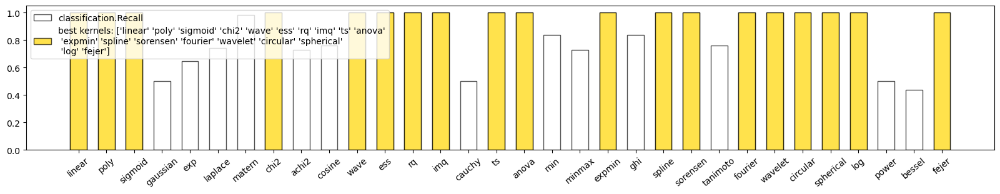

classification.Recall
best kernels: ['linear' 'poly' 'sigmoid' 'chi2' 'wave' 'ess' 'rq' 'imq' 'ts' 'anova'
 'expmin' 'spline' 'sorensen' 'fourier' 'wavelet' 'circular' 'spherical'
 'log' 'fejer']
best value: 1.0


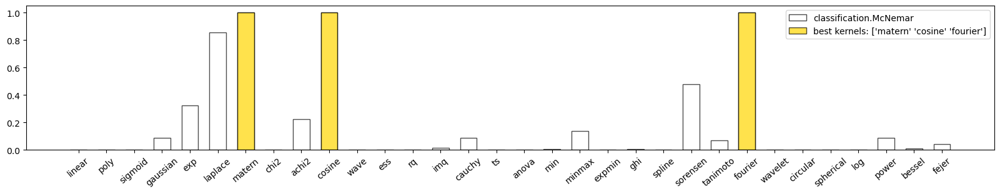

classification.McNemar
best kernels: ['matern' 'cosine' 'fourier']
best value: 1.0


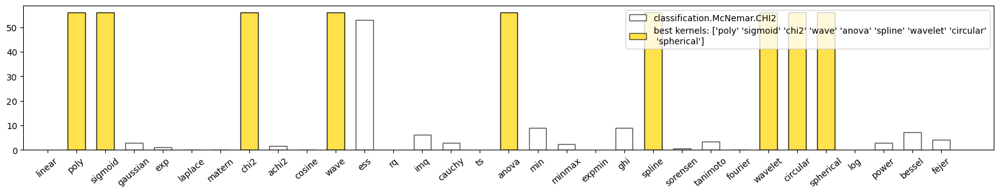

classification.McNemar.CHI2
best kernels: ['poly' 'sigmoid' 'chi2' 'wave' 'anova' 'spline' 'wavelet' 'circular'
 'spherical']
best value: 56.01724137931034


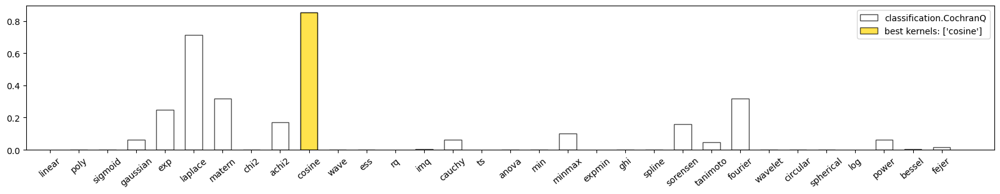

classification.CochranQ
best kernels: ['cosine']
best value: 0.8526836843346426


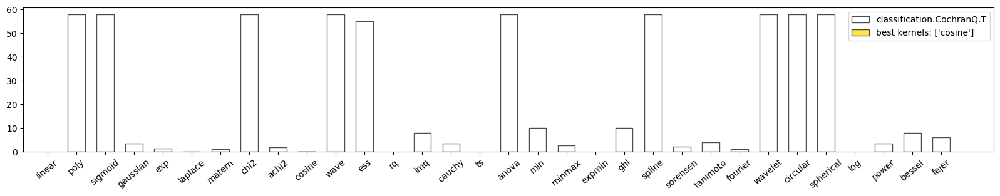

classification.CochranQ.T
best kernels: ['cosine']
best value: 0.034482758620689655


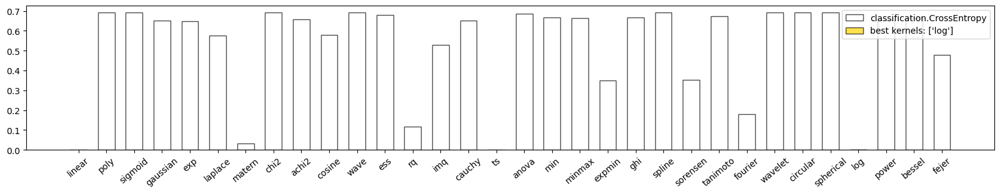

classification.CrossEntropy
best kernels: ['log']
best value: 0.00019050009338277164


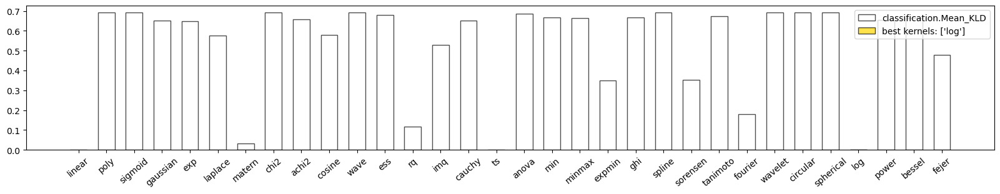

classification.Mean_KLD
best kernels: ['log']
best value: 0.00019050009338277064


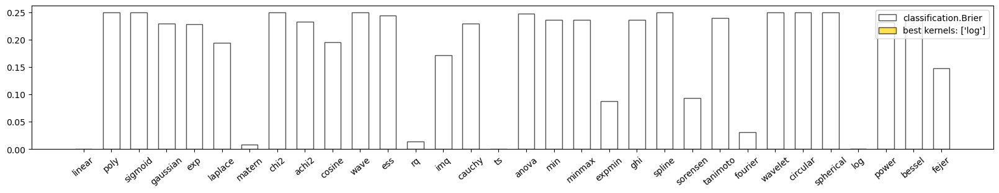

classification.Brier
best kernels: ['log']
best value: 1.281244593770849e-07


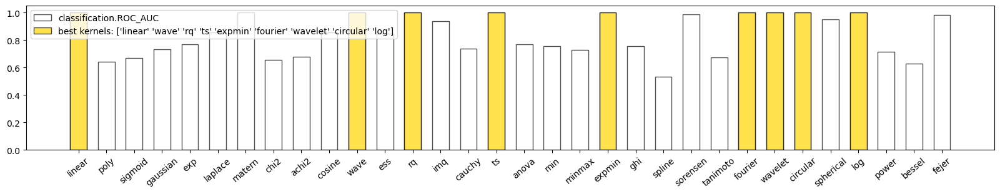

classification.ROC_AUC
best kernels: ['linear' 'wave' 'rq' 'ts' 'expmin' 'fourier' 'wavelet' 'circular' 'log']
best value: 1.0


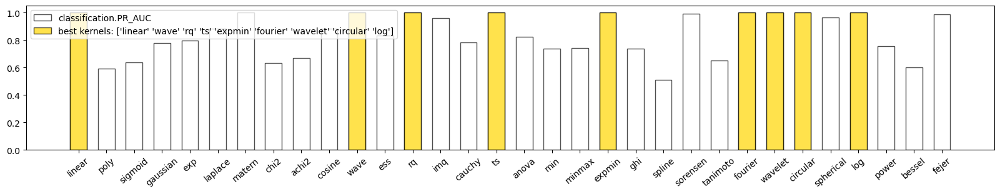

classification.PR_AUC
best kernels: ['linear' 'wave' 'rq' 'ts' 'expmin' 'fourier' 'wavelet' 'circular' 'log']
best value: 1.0


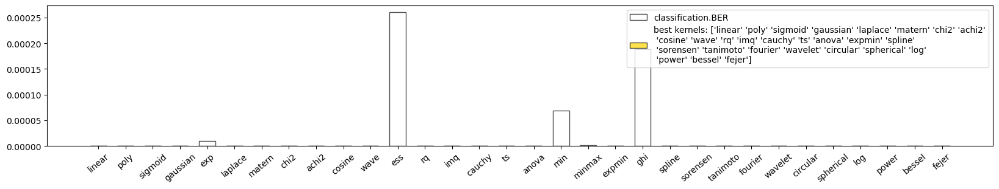

classification.BER
best kernels: ['linear' 'poly' 'sigmoid' 'gaussian' 'laplace' 'matern' 'chi2' 'achi2'
 'cosine' 'wave' 'rq' 'imq' 'cauchy' 'ts' 'anova' 'expmin' 'spline'
 'sorensen' 'tanimoto' 'fourier' 'wavelet' 'circular' 'spherical' 'log'
 'power' 'bessel' 'fejer']
best value: 0.0


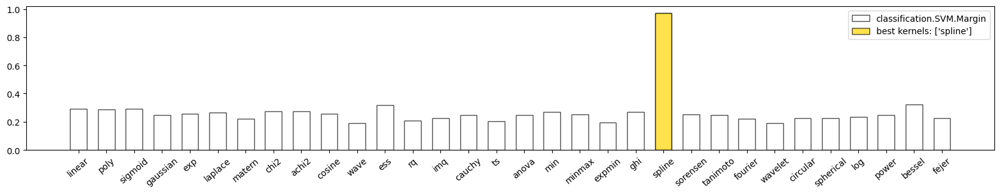

classification.SVM.Margin
best kernels: ['spline']
best value: 0.9712889638169998


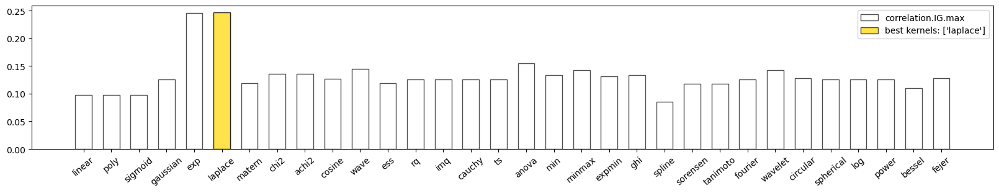

correlation.IG.max
best kernels: ['laplace']
best value: 0.24665312800005612


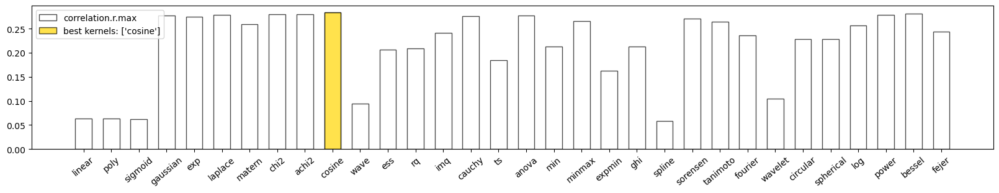

correlation.r.max
best kernels: ['cosine']
best value: 0.2838513098285293


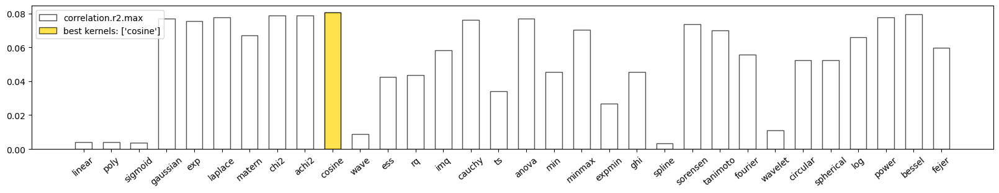

correlation.r2.max
best kernels: ['cosine']
best value: 0.08057156609137173


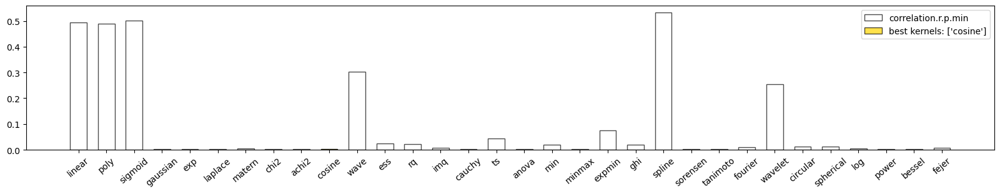

correlation.r.p.min
best kernels: ['cosine']
best value: 0.0016792758838866887


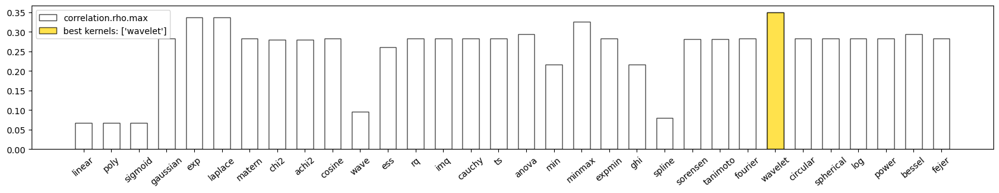

correlation.rho.max
best kernels: ['wavelet']
best value: 0.34998467375727954


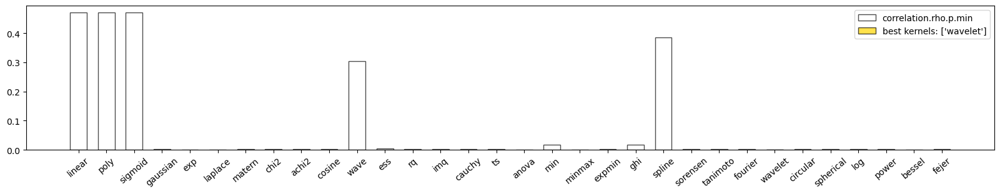

correlation.rho.p.min
best kernels: ['wavelet']
best value: 8.912651594614364e-05


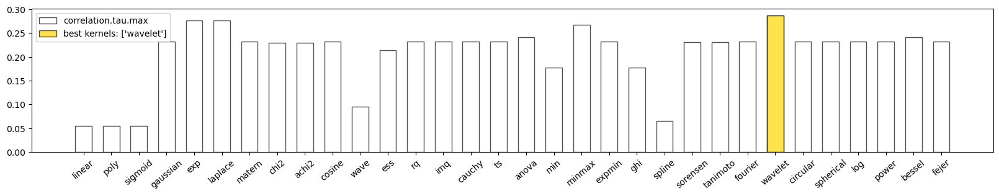

correlation.tau.max
best kernels: ['wavelet']
best value: 0.2869494912549334


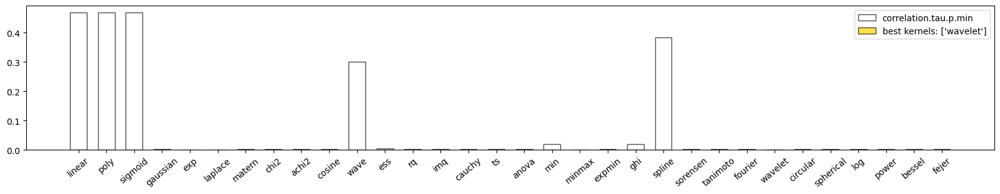

correlation.tau.p.min
best kernels: ['wavelet']
best value: 0.0001346022464697799


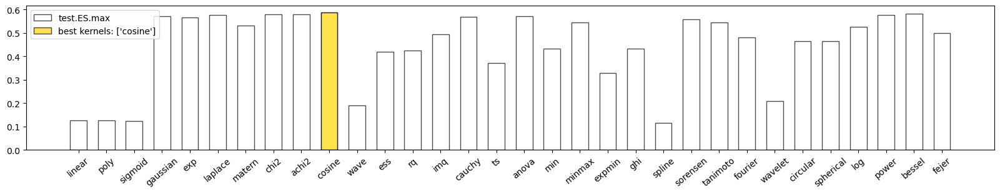

test.ES.max
best kernels: ['cosine']
best value: 0.5874267542869923


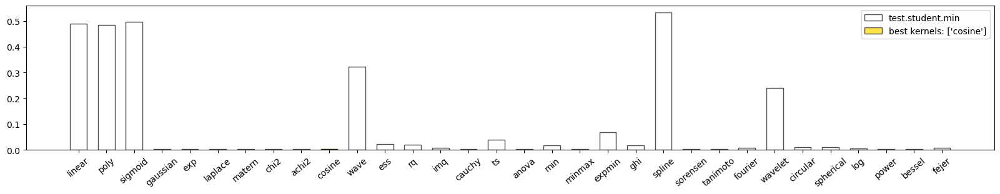

test.student.min
best kernels: ['cosine']
best value: 0.0014662431834658446


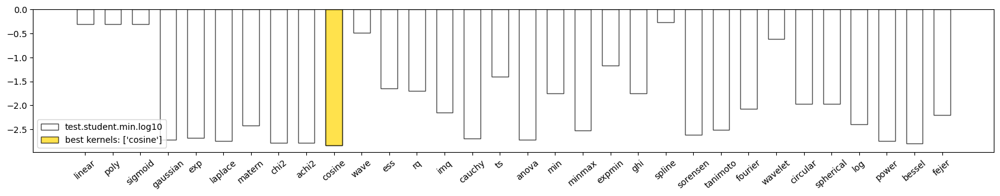

test.student.min.log10
best kernels: ['cosine']
best value: -2.833793993897762


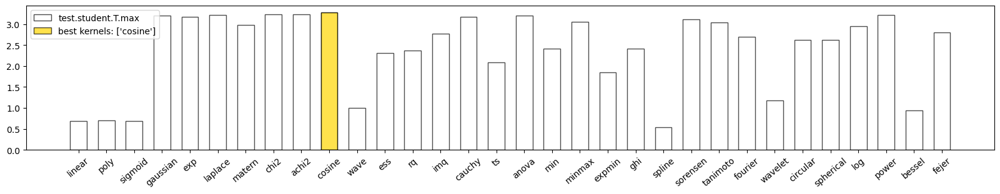

test.student.T.max
best kernels: ['cosine']
best value: 3.2814196126871895


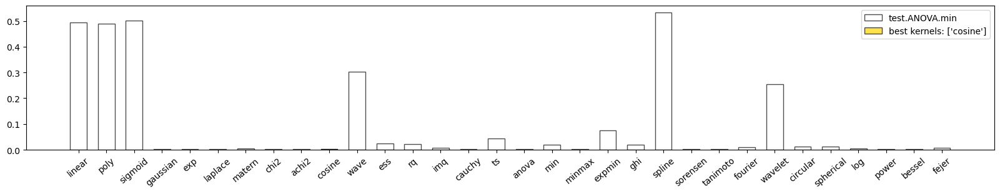

test.ANOVA.min
best kernels: ['cosine']
best value: 0.0016792758838867065


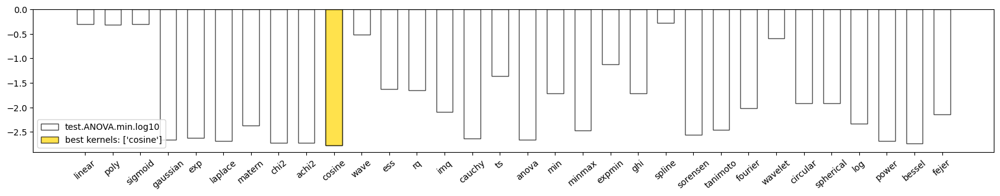

test.ANOVA.min.log10
best kernels: ['cosine']
best value: -2.7748779488845434


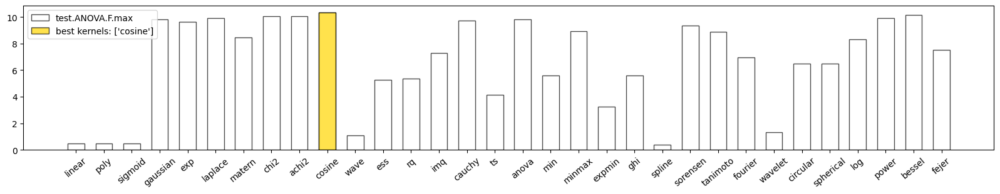

test.ANOVA.F.max
best kernels: ['cosine']
best value: 10.340603409842666


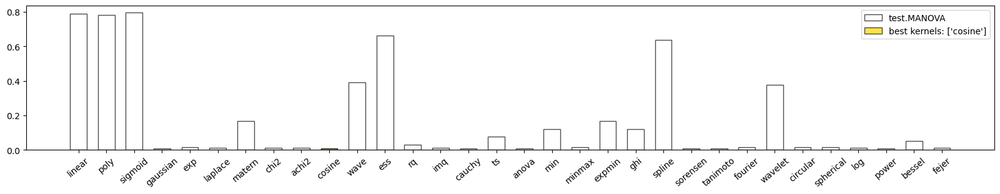

test.MANOVA
best kernels: ['cosine']
best value: 0.006019


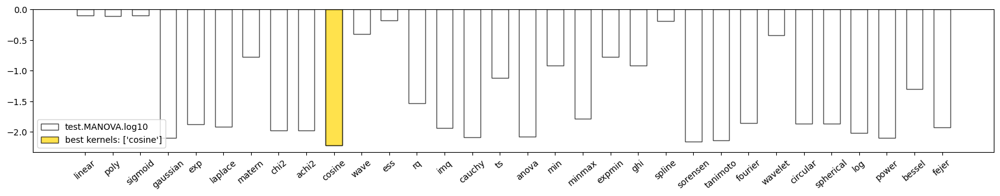

test.MANOVA.log10
best kernels: ['cosine']
best value: -2.22047565667521


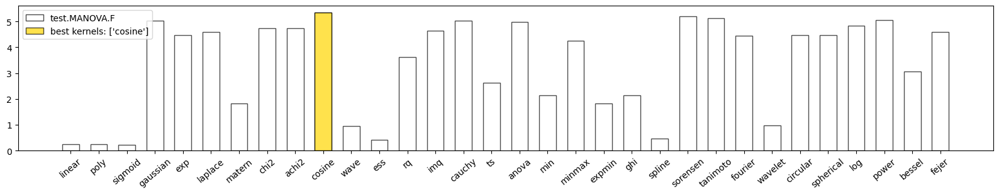

test.MANOVA.F
best kernels: ['cosine']
best value: 5.342878


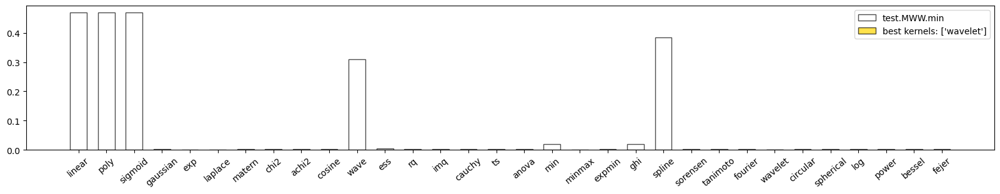

test.MWW.min
best kernels: ['wavelet']
best value: 0.00013604167358099


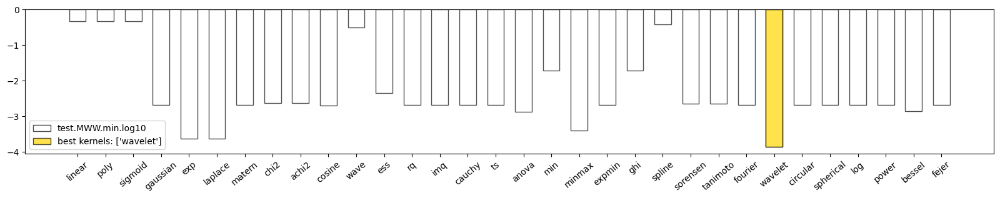

test.MWW.min.log10
best kernels: ['wavelet']
best value: -3.866328034027479


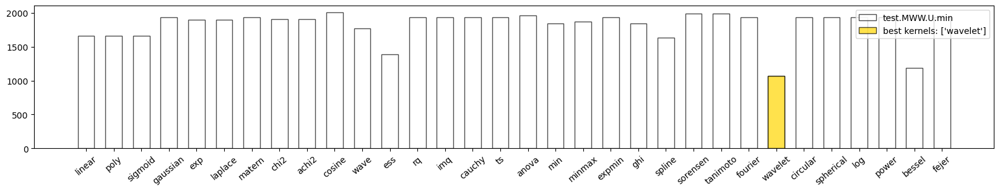

test.MWW.U.min
best kernels: ['wavelet']
best value: 1071.0


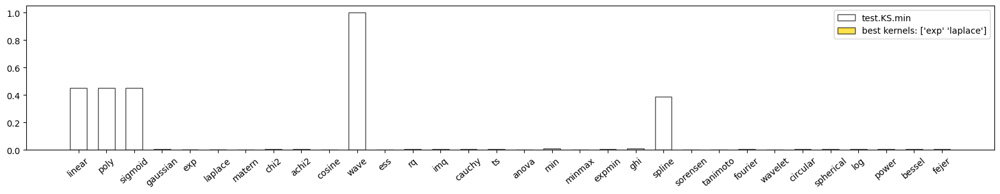

test.KS.min
best kernels: ['exp' 'laplace']
best value: 0.00044038577950089586


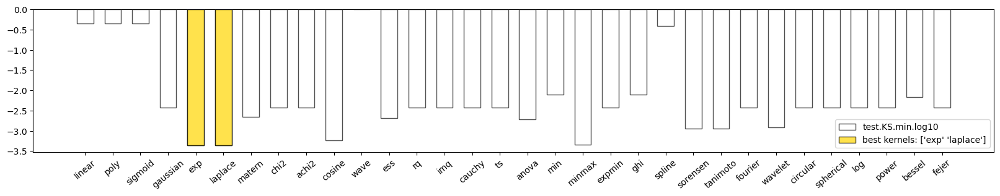

test.KS.min.log10
best kernels: ['exp' 'laplace']
best value: -3.3561667132788564


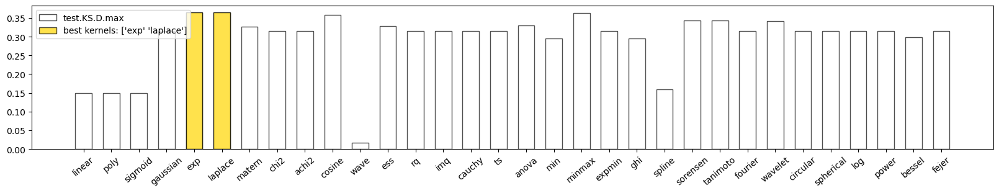

test.KS.D.max
best kernels: ['exp' 'laplace']
best value: 0.36484983314794217


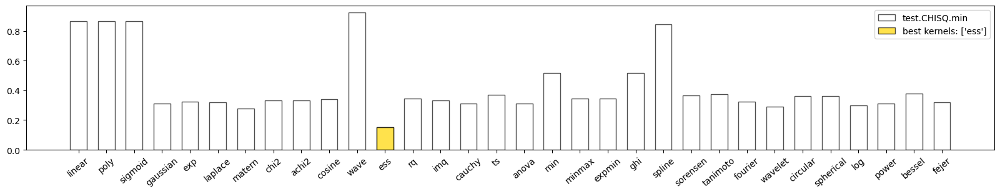

test.CHISQ.min
best kernels: ['ess']
best value: 0.1526140425281151


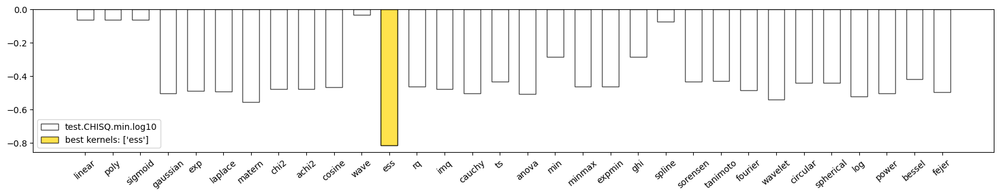

test.CHISQ.min.log10
best kernels: ['ess']
best value: -0.8164055036557922


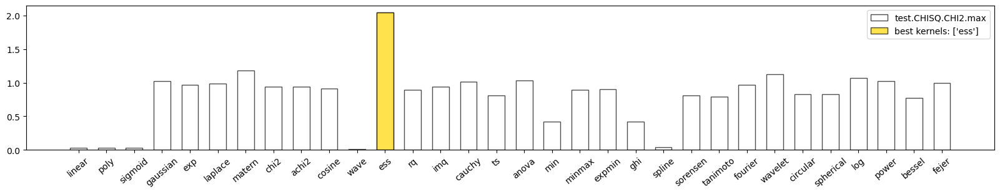

test.CHISQ.CHI2.max
best kernels: ['ess']
best value: 2.0459265370336532


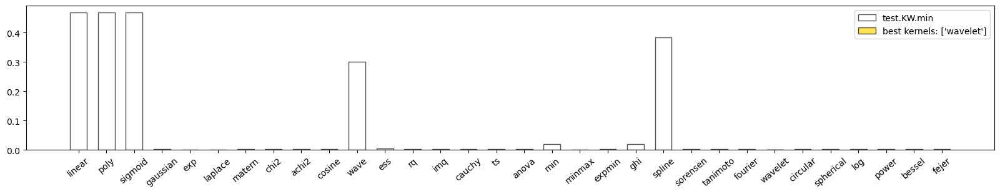

test.KW.min
best kernels: ['wavelet']
best value: 0.0001346022464697851


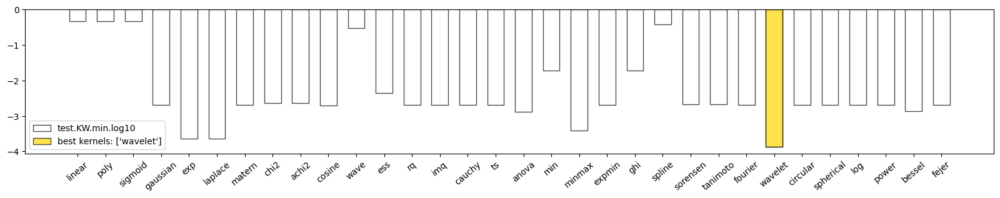

test.KW.min.log10
best kernels: ['wavelet']
best value: -3.8709476918112253


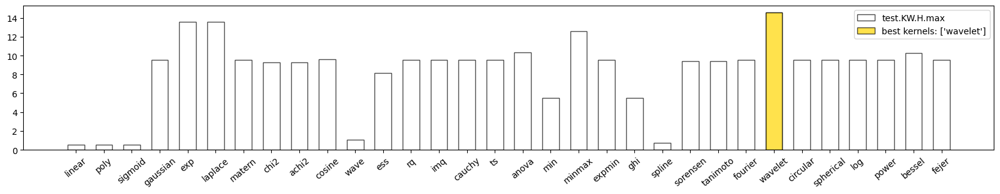

test.KW.H.max
best kernels: ['wavelet']
best value: 14.576223351933663


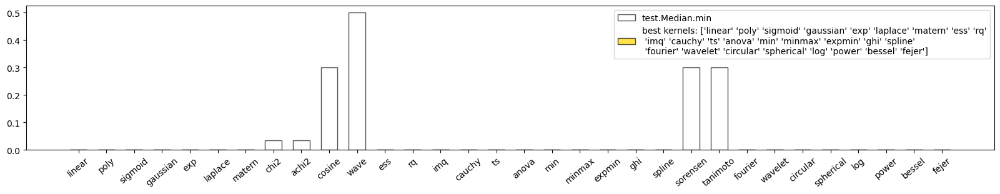

test.Median.min
best kernels: ['linear' 'poly' 'sigmoid' 'gaussian' 'exp' 'laplace' 'matern' 'ess' 'rq'
 'imq' 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin' 'ghi' 'spline'
 'fourier' 'wavelet' 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
best value: 0.0


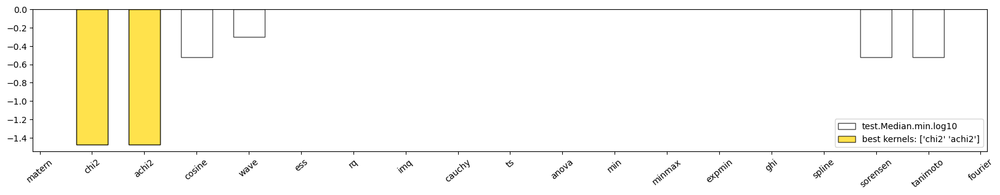

test.Median.min.log10
best kernels: ['chi2' 'achi2']
best value: -1.4766384370135663


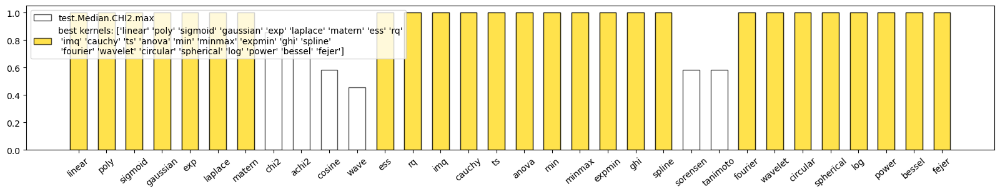

test.Median.CHI2.max
best kernels: ['linear' 'poly' 'sigmoid' 'gaussian' 'exp' 'laplace' 'matern' 'ess' 'rq'
 'imq' 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin' 'ghi' 'spline'
 'fourier' 'wavelet' 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
best value: 1.0


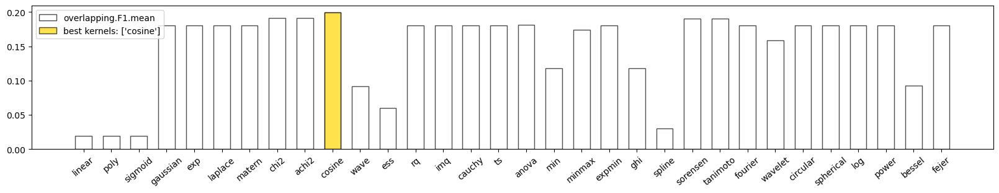

overlapping.F1.mean
best kernels: ['cosine']
best value: 0.19941183148158062


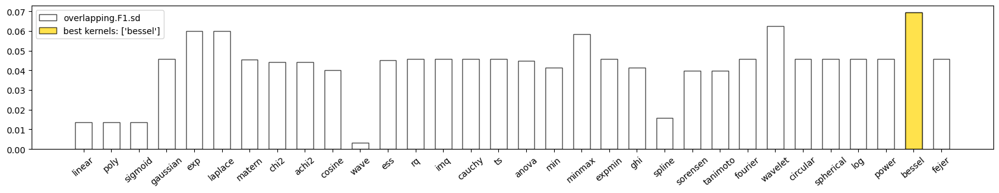

overlapping.F1.sd
best kernels: ['bessel']
best value: 0.0693812024079649


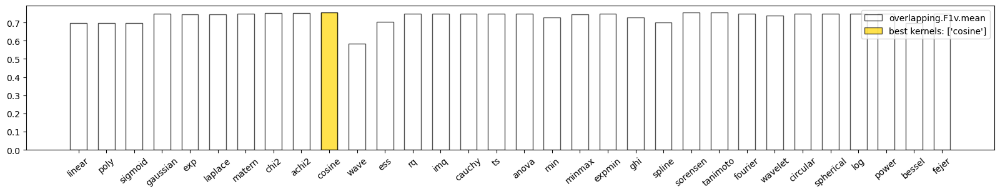

overlapping.F1v.mean
best kernels: ['cosine']
best value: 0.7555555555555555


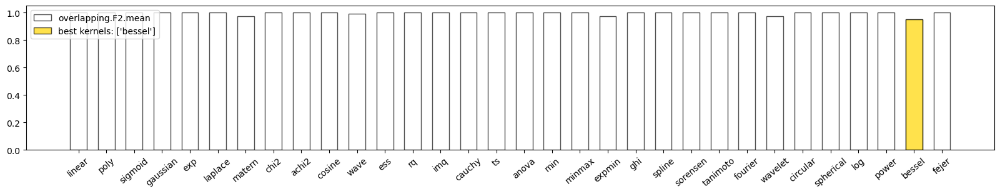

overlapping.F2.mean
best kernels: ['bessel']
best value: 0.95


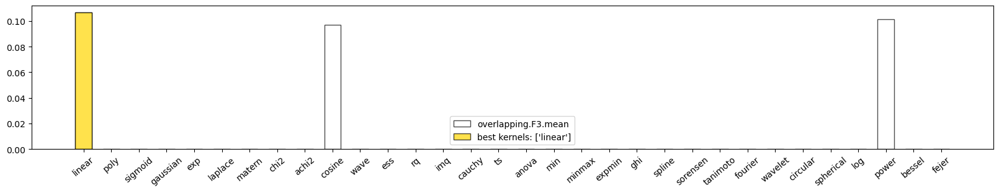

overlapping.F3.mean
best kernels: ['linear']
best value: 0.10678652777683761
All-NaN slice encountered


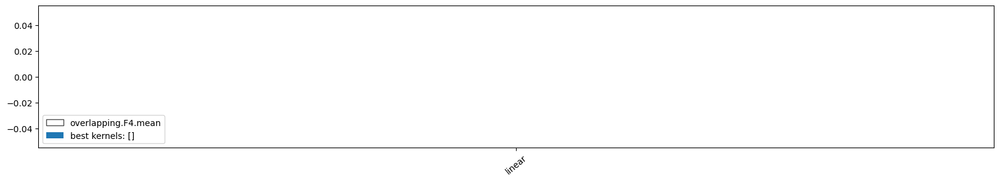

overlapping.F4.mean
best kernels: []
best value: None


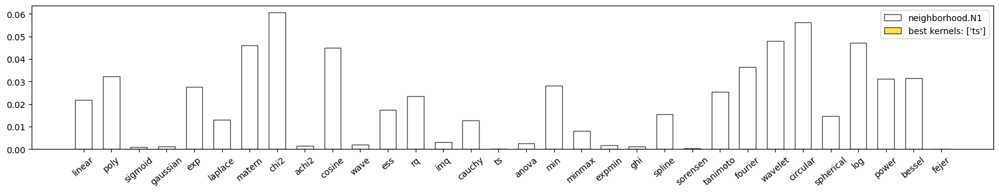

neighborhood.N1
best kernels: ['ts']
best value: 1.7350669759825947e-08


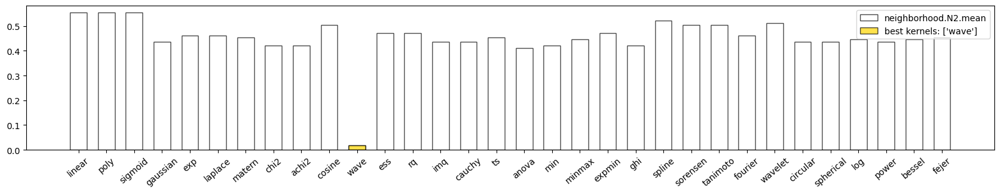

neighborhood.N2.mean
best kernels: ['wave']
best value: 0.01680672268907563


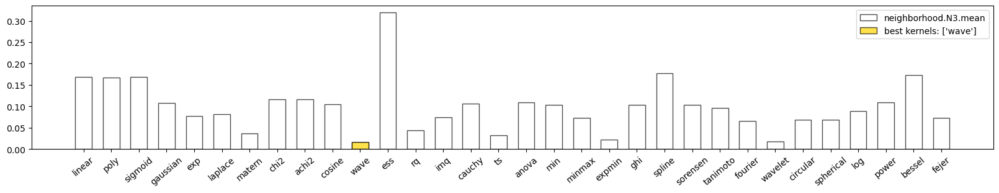

neighborhood.N3.mean
best kernels: ['wave']
best value: 0.016666666666666666


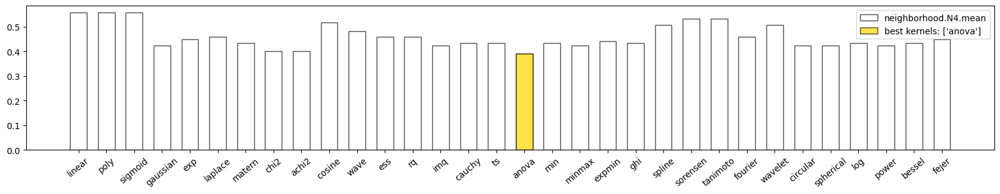

neighborhood.N4.mean
best kernels: ['anova']
best value: 0.39166666666666666


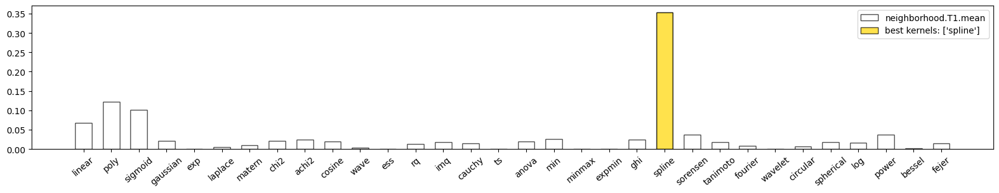

neighborhood.T1.mean
best kernels: ['spline']
best value: 0.35296062968503567


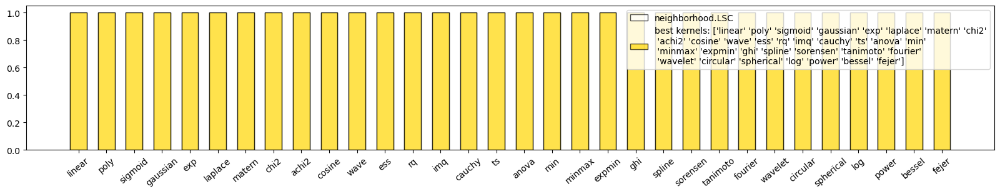

neighborhood.LSC
best kernels: ['linear' 'poly' 'sigmoid' 'gaussian' 'exp' 'laplace' 'matern' 'chi2'
 'achi2' 'cosine' 'wave' 'ess' 'rq' 'imq' 'cauchy' 'ts' 'anova' 'min'
 'minmax' 'expmin' 'ghi' 'spline' 'sorensen' 'tanimoto' 'fourier'
 'wavelet' 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
best value: 1.0


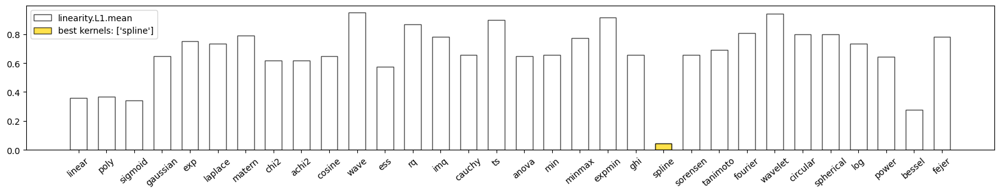

linearity.L1.mean
best kernels: ['spline']
best value: 0.041666666666666664


,linear,poly,sigmoid,gaussian,exp,laplace,matern,chi2,achi2,cosine,wave,ess,rq,imq,cauchy,ts,anova,min,minmax,expmin,ghi,spline,sorensen,tanimoto,fourier,wavelet,circular,spherical,log,power,bessel,fejer,best kernel(s)
classification.ACC,1.0,0.517,0.517,0.592,0.692,0.75,0.992,0.517,0.642,0.758,0.517,0.542,1.0,0.933,0.592,1.0,0.517,0.667,0.625,1.0,0.667,0.517,0.983,0.642,0.992,0.517,0.517,0.517,1.0,0.592,0.583,0.95,['linear' 'rq' 'ts' 'expmin' 'log']
classification.Kappa,1.0,0.0,0.0,0.188,0.385,0.5,0.983,0.0,0.279,0.516,0.0,0.053,1.0,0.866,0.188,1.0,0.0,0.325,0.245,1.0,0.325,0.0,0.967,0.277,0.983,0.0,0.0,0.0,1.0,0.188,0.175,0.9,['linear' 'rq' 'ts' 'expmin' 'log']
classification.F1_Score,1.0,0.681,0.681,0.559,0.684,0.754,0.992,0.681,0.677,0.764,0.681,0.693,1.0,0.939,0.559,1.0,0.681,0.722,0.667,1.0,0.722,0.681,0.984,0.686,0.992,0.681,0.681,0.681,1.0,0.559,0.519,0.954,['linear' 'rq' 'ts' 'expmin' 'log']
classification.Jaccard,1.0,0.517,0.517,0.388,0.519,0.605,0.984,0.517,0.511,0.618,0.517,0.53,1.0,0.886,0.388,1.0,0.517,0.565,0.5,1.0,0.565,0.517,0.969,0.522,0.984,0.517,0.517,0.517,1.0,0.388,0.351,0.912,['linear' 'rq' 'ts' 'expmin' 'log']
classification.Precision,1.0,0.517,0.517,0.633,0.727,0.767,1.0,0.517,0.634,0.77,0.517,0.53,1.0,0.886,0.633,1.0,0.517,0.634,0.616,1.0,0.634,0.517,0.969,0.627,0.984,0.517,0.517,0.517,1.0,0.633,0.643,0.912,['linear' 'matern' 'rq' 'ts' 'expmin' 'log']
classification.Recall,1.0,1.0,1.0,0.5,0.645,0.742,0.984,1.0,0.726,0.758,1.0,1.0,1.0,1.0,0.5,1.0,1.0,0.839,0.726,1.0,0.839,1.0,1.0,0.758,1.0,1.0,1.0,1.0,1.0,0.5,0.435,1.0,['linear' 'poly' 'sigmoid' 'chi2' 'wave' 'ess' 'rq' 'imq' 'ts' 'anova' 'expmin' 'spline' 'sorensen' 'fourier' 'wavelet' 'circular' 'spherical' 'log' 'fejer']
classification.McNemar,0.0,0.0,0.0,0.086,0.324,0.855,1.0,0.0,0.222,1.0,0.0,0.0,0.0,0.013,0.086,0.0,0.0,0.003,0.136,0.0,0.003,0.0,0.48,0.067,1.0,0.0,0.0,0.0,0.0,0.086,0.007,0.041,['matern' 'cosine' 'fourier']
classification.McNemar.CHI2,inf,56.017,56.017,2.939,0.973,0.033,0.0,56.017,1.488,0.0,56.017,53.018,inf,6.125,2.939,inf,56.017,9.025,2.222,inf,9.025,56.017,0.5,3.349,0.0,56.017,56.017,56.017,inf,2.939,7.22,4.167,['poly' 'sigmoid' 'chi2' 'wave' 'anova' 'spline' 'wavelet' 'circular' 'spherical']
classification.CochranQ,nan,0.0,0.0,0.063,0.25,0.715,0.317,0.0,0.17,0.853,0.0,0.0,nan,0.005,0.063,nan,0.0,0.002,0.101,nan,0.002,0.0,0.157,0.047,0.317,0.0,0.0,0.0,nan,0.063,0.005,0.014,['cosine']
classification.CochranQ.T,nan,58.0,58.0,3.449,1.324,0.133,1.0,58.0,1.884,0.034,58.0,55.0,nan,8.0,3.449,nan,58.0,10.0,2.689,nan,10.0,58.0,2.0,3.93,1.0,58.0,58.0,58.0,nan,3.449,8.0,6.0,['cosine']


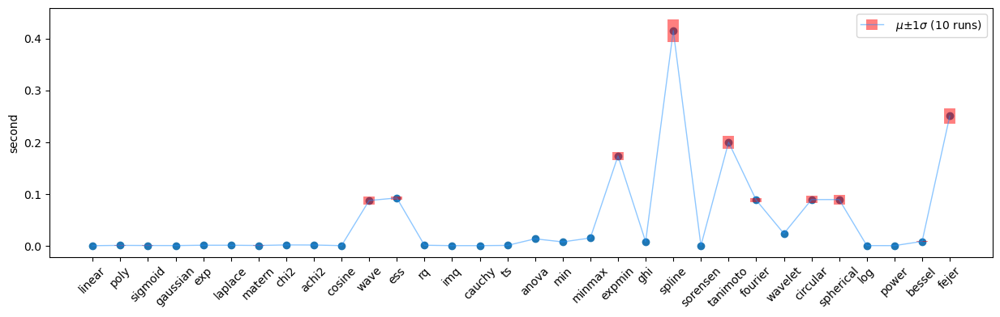

Averaged run time:  {'linear': 0.0004013200000002826, 'poly': 0.0009591799999995488, 'sigmoid': 0.0007274699999996415, 'gaussian': 0.0005938999999997918, 'exp': 0.00125748000000101, 'laplace': 0.0012207599999996433, 'matern': 0.0007889100000028293, 'chi2': 0.0018203999999997222, 'achi2': 0.001683959999999729, 'cosine': 0.000468579999997587, 'wave': 0.08756797000000205, 'ess': 0.09248230000000177, 'rq': 0.0012401999999994474, 'imq': 0.0004806400000020972, 'cauchy': 0.0004884200000006445, 'ts': 0.0009005400000049235, 'anova': 0.013639829999996777, 'min': 0.007697239999998828, 'minmax': 0.015202959999997745, 'expmin': 0.1735259300000024, 'ghi': 0.00801903999999638, 'spline': 0.4153806199999991, 'sorensen': 0.00046722000000158913, 'tanimoto': 0.19999484999999878, 'fourier': 0.08826063000000203, 'wavelet': 0.02379085999999688, 'circular': 0.089320280000004, 'spherical': 0.08941407999999455, 'log': 0.0005772299999989627, 'power': 0.00048134999999831506, 'bessel': 0.008650899999997819, 'fejer

In [5]:
analyze_dataset('salt')

load dataset from 754b_C2S_Shihu.csv
X.shape (204, 877)  y.shape (204,)


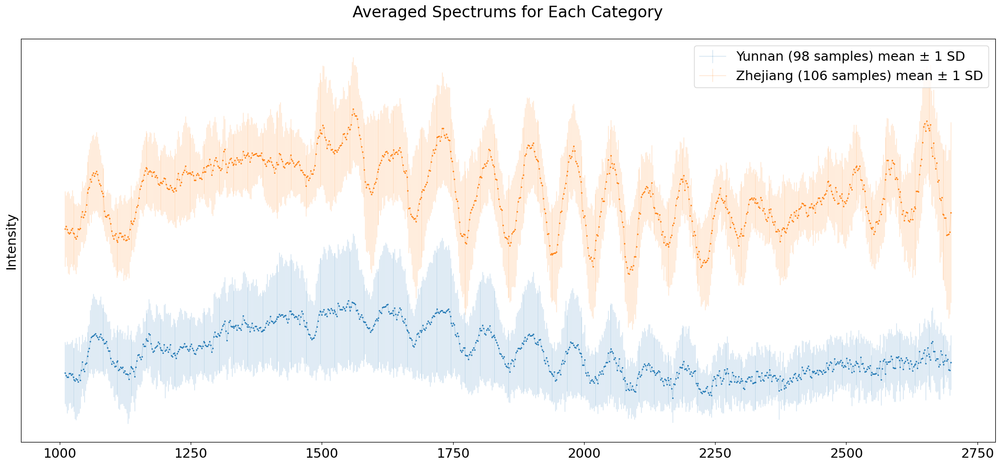

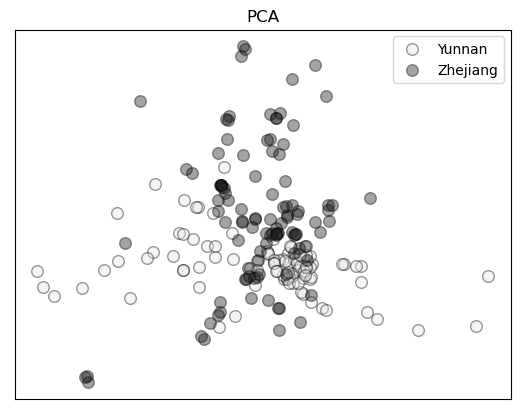

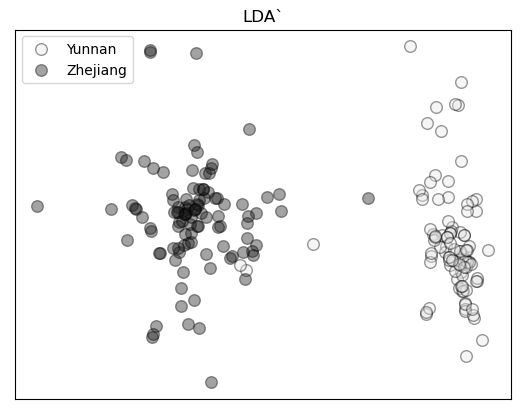

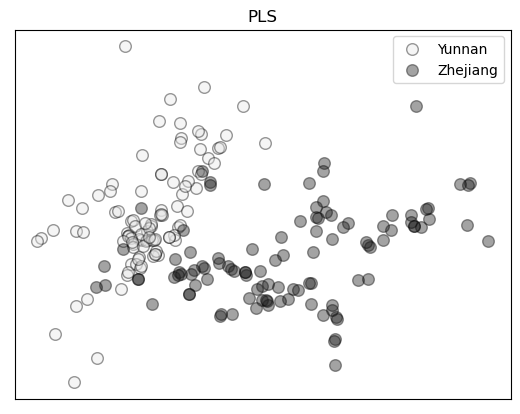

Data Set ID: 754b 铁皮石斛拉曼光谱

[云南，浙江温州]

C1 - Yunan Province (112 samples)
C2 - Wenzhou, Zhejiang Province (120 samples)

铁皮石斛拉曼光谱采集
（1）采集磐安、乐青、云南等多个产地的铁皮石斛干品样本，每个产地收集m份，样品经中药高速粉碎机成粉末样品，过200目筛后放入自封袋保存备用。
（2）实验采用美国Thermofisher公司生产的DXR2xi型显微拉曼光谱仪，拉曼光谱系统的激发波长为785nm，测量范围为50～3400 cm-1，激光功率30 mW，曝光时间0.5 s，扫描次数1000次。待测样品粉末平铺于载玻片上制成厚度均匀的片状样品后置于载物台上进行拉曼光谱采集。


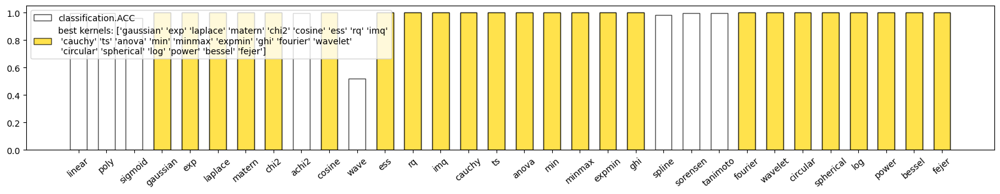

classification.ACC
best kernels: ['gaussian' 'exp' 'laplace' 'matern' 'chi2' 'cosine' 'ess' 'rq' 'imq'
 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin' 'ghi' 'fourier' 'wavelet'
 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
best value: 1.0


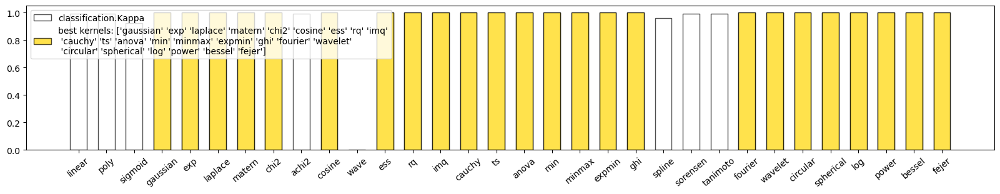

classification.Kappa
best kernels: ['gaussian' 'exp' 'laplace' 'matern' 'chi2' 'cosine' 'ess' 'rq' 'imq'
 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin' 'ghi' 'fourier' 'wavelet'
 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
best value: 1.0


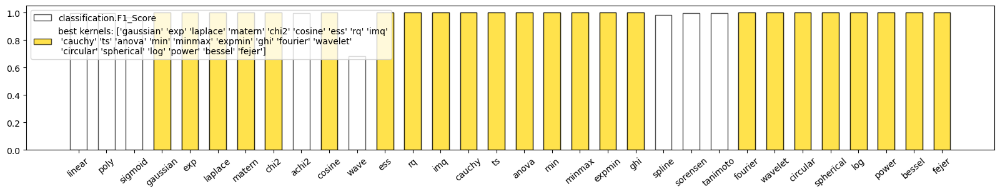

classification.F1_Score
best kernels: ['gaussian' 'exp' 'laplace' 'matern' 'chi2' 'cosine' 'ess' 'rq' 'imq'
 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin' 'ghi' 'fourier' 'wavelet'
 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
best value: 1.0


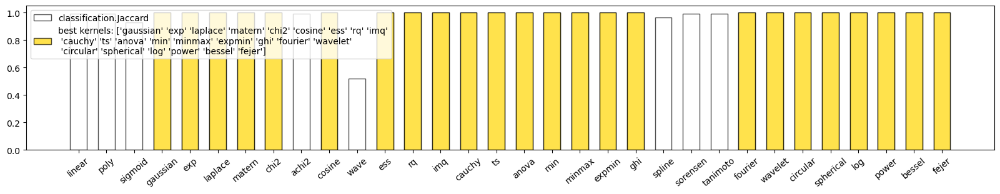

classification.Jaccard
best kernels: ['gaussian' 'exp' 'laplace' 'matern' 'chi2' 'cosine' 'ess' 'rq' 'imq'
 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin' 'ghi' 'fourier' 'wavelet'
 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
best value: 1.0


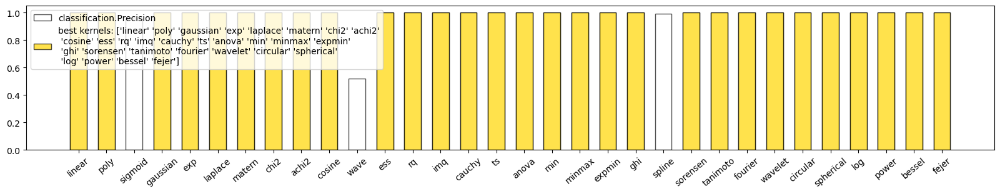

classification.Precision
best kernels: ['linear' 'poly' 'gaussian' 'exp' 'laplace' 'matern' 'chi2' 'achi2'
 'cosine' 'ess' 'rq' 'imq' 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin'
 'ghi' 'sorensen' 'tanimoto' 'fourier' 'wavelet' 'circular' 'spherical'
 'log' 'power' 'bessel' 'fejer']
best value: 1.0


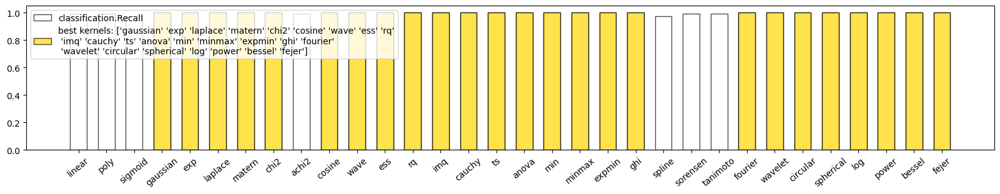

classification.Recall
best kernels: ['gaussian' 'exp' 'laplace' 'matern' 'chi2' 'cosine' 'wave' 'ess' 'rq'
 'imq' 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin' 'ghi' 'fourier'
 'wavelet' 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
best value: 1.0


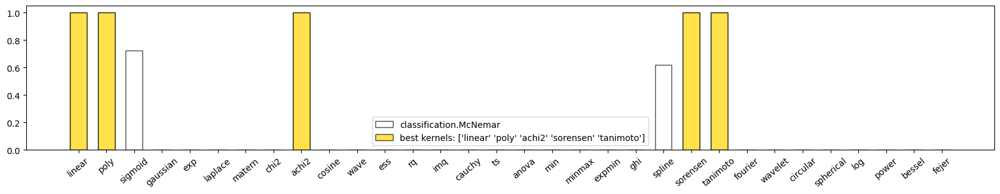

classification.McNemar
best kernels: ['linear' 'poly' 'achi2' 'sorensen' 'tanimoto']
best value: 1.0


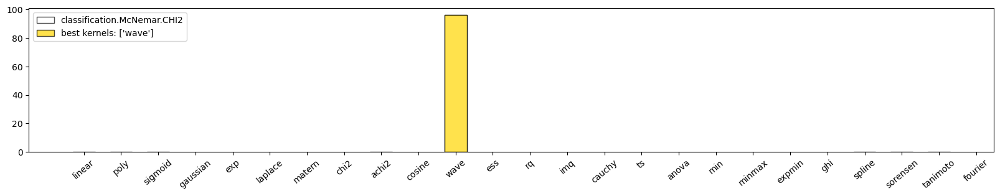

classification.McNemar.CHI2
best kernels: ['wave']
best value: 96.01020408163265


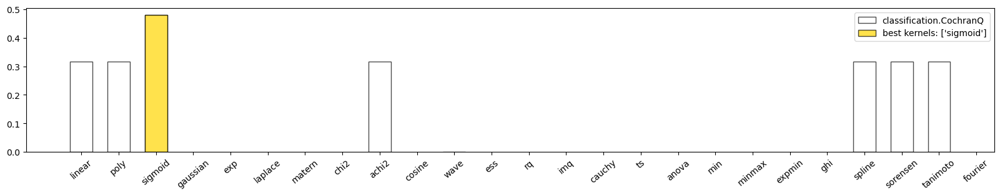

classification.CochranQ
best kernels: ['sigmoid']
best value: 0.47950012218695337


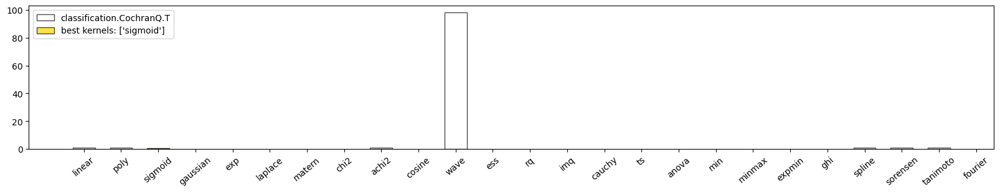

classification.CochranQ.T
best kernels: ['sigmoid']
best value: 0.5


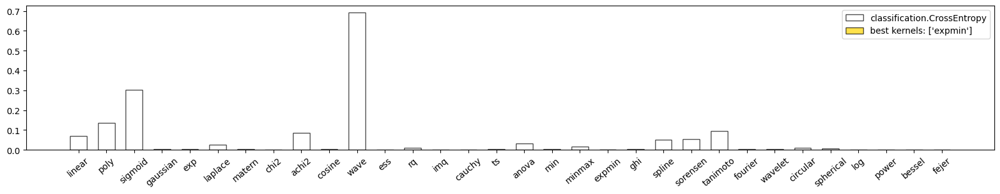

classification.CrossEntropy
best kernels: ['expmin']
best value: 0.00010557336647383512


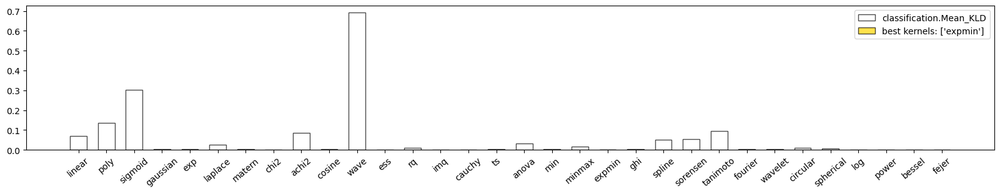

classification.Mean_KLD
best kernels: ['expmin']
best value: 0.00010557336647384037


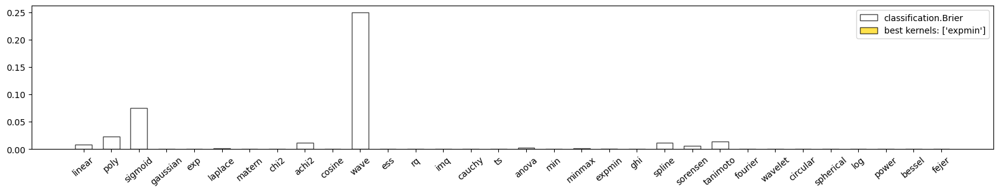

classification.Brier
best kernels: ['expmin']
best value: 6.384140879806275e-08


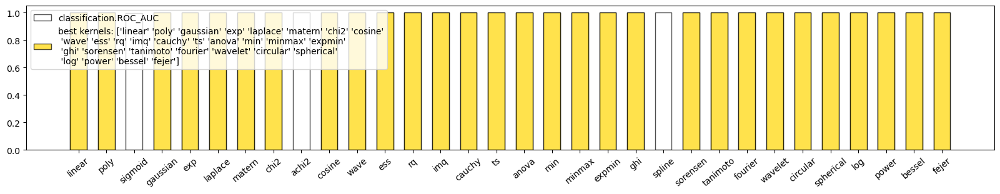

classification.ROC_AUC
best kernels: ['linear' 'poly' 'gaussian' 'exp' 'laplace' 'matern' 'chi2' 'cosine'
 'wave' 'ess' 'rq' 'imq' 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin'
 'ghi' 'sorensen' 'tanimoto' 'fourier' 'wavelet' 'circular' 'spherical'
 'log' 'power' 'bessel' 'fejer']
best value: 1.0


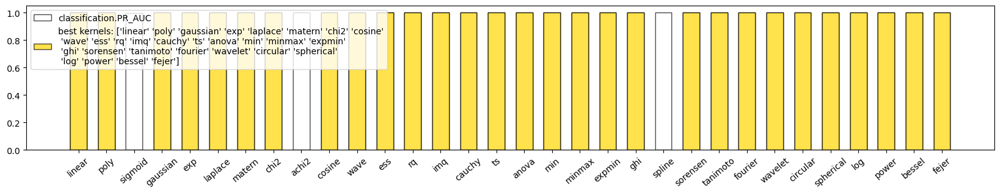

classification.PR_AUC
best kernels: ['linear' 'poly' 'gaussian' 'exp' 'laplace' 'matern' 'chi2' 'cosine'
 'wave' 'ess' 'rq' 'imq' 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin'
 'ghi' 'sorensen' 'tanimoto' 'fourier' 'wavelet' 'circular' 'spherical'
 'log' 'power' 'bessel' 'fejer']
best value: 1.0


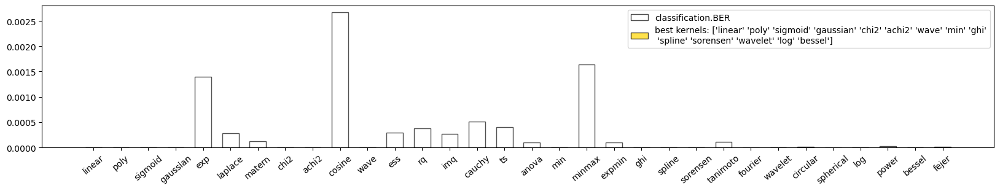

classification.BER
best kernels: ['linear' 'poly' 'sigmoid' 'gaussian' 'chi2' 'achi2' 'wave' 'min' 'ghi'
 'spline' 'sorensen' 'wavelet' 'log' 'bessel']
best value: 0.0


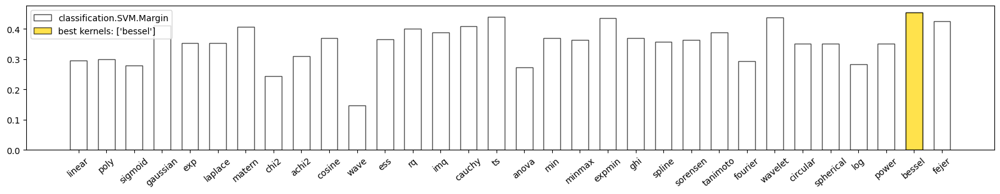

classification.SVM.Margin
best kernels: ['bessel']
best value: 0.4538030875475199


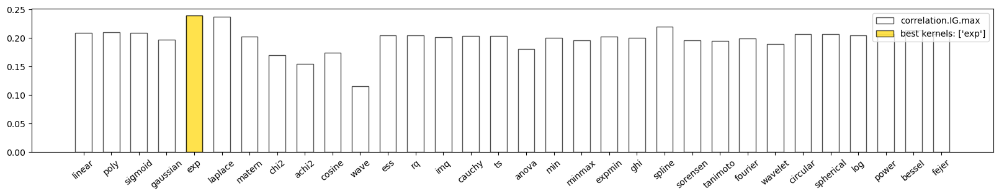

correlation.IG.max
best kernels: ['exp']
best value: 0.2391561833433109


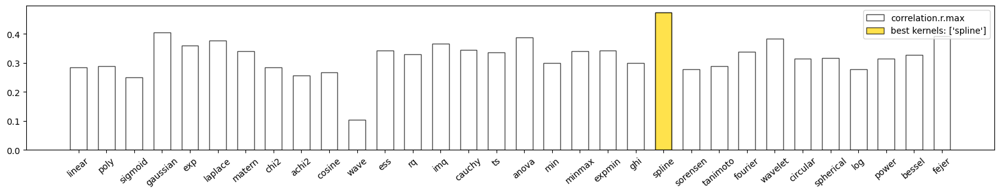

correlation.r.max
best kernels: ['spline']
best value: 0.47336212912381764


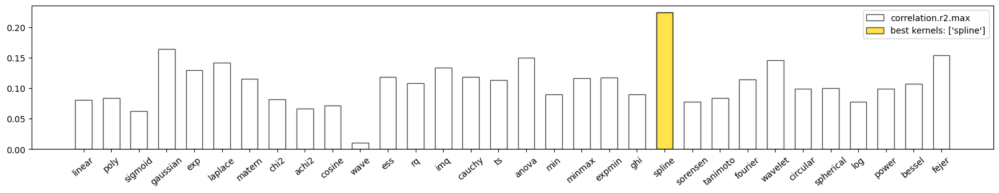

correlation.r2.max
best kernels: ['spline']
best value: 0.22407170528863382


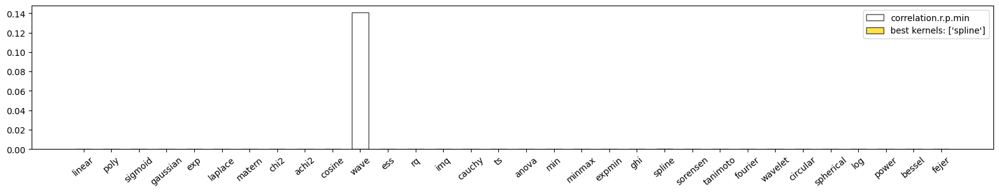

correlation.r.p.min
best kernels: ['spline']
best value: 8.678172273732313e-13


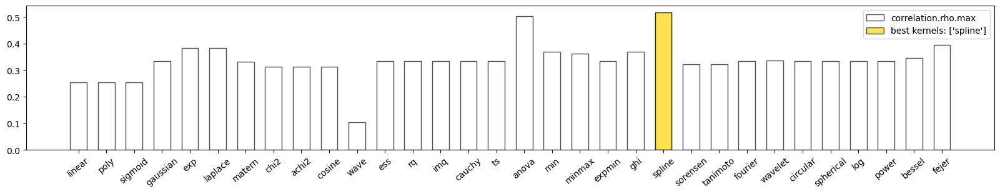

correlation.rho.max
best kernels: ['spline']
best value: 0.5168227826184225


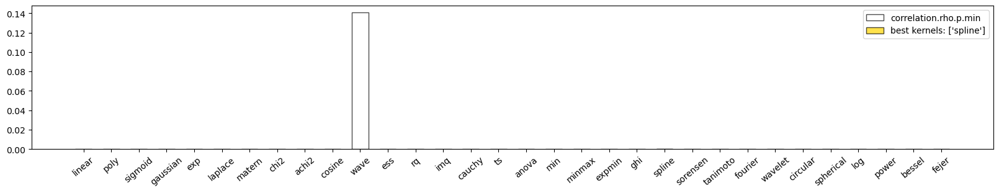

correlation.rho.p.min
best kernels: ['spline']
best value: 2.505514483131019e-15


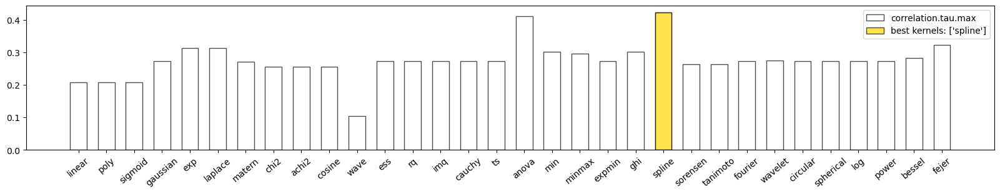

correlation.tau.max
best kernels: ['spline']
best value: 0.4230271108757869


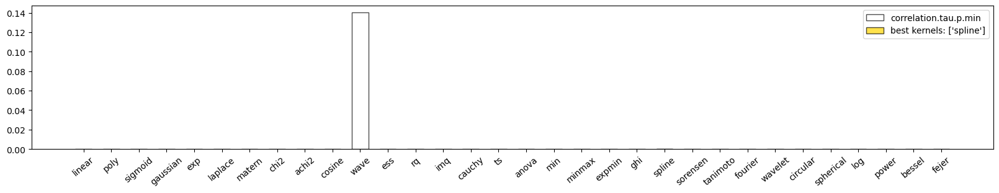

correlation.tau.p.min
best kernels: ['spline']
best value: 1.7902741073096558e-13


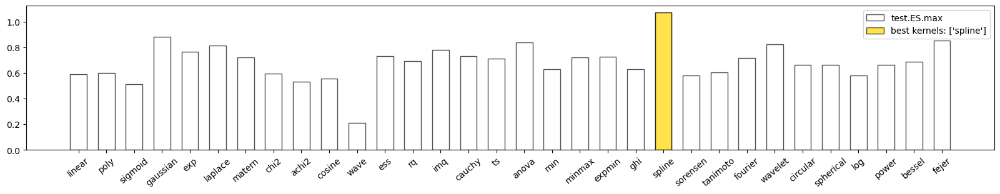

test.ES.max
best kernels: ['spline']
best value: 1.0703048986569292


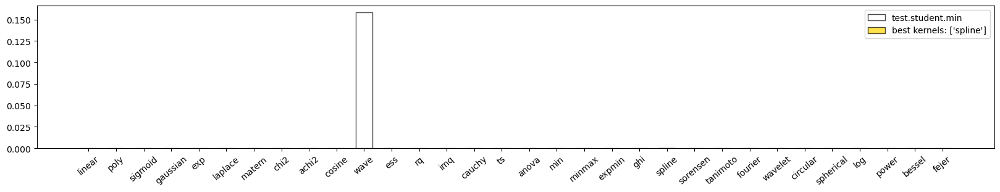

test.student.min
best kernels: ['spline']
best value: 8.653363536799176e-13


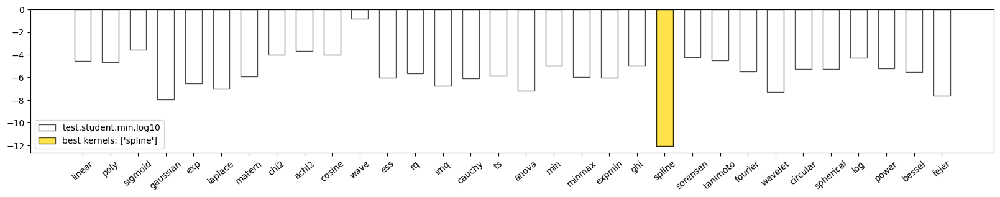

test.student.min.log10
best kernels: ['spline']
best value: -12.062815050738982


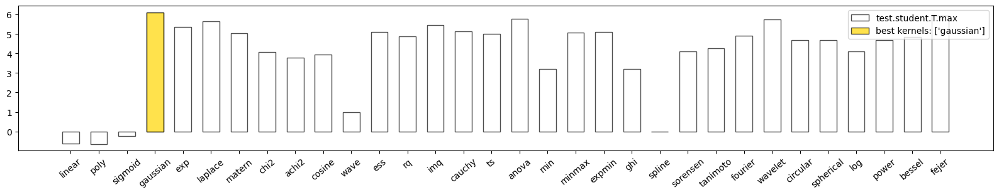

test.student.T.max
best kernels: ['gaussian']
best value: 6.111325261970686


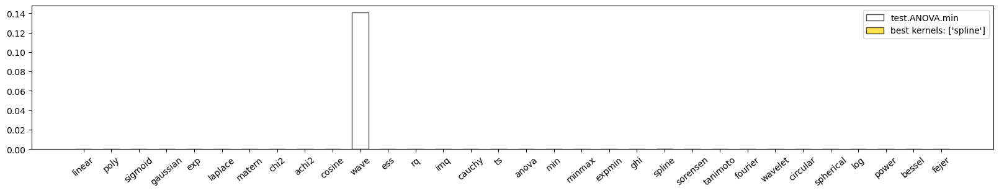

test.ANOVA.min
best kernels: ['spline']
best value: 8.678172273731332e-13


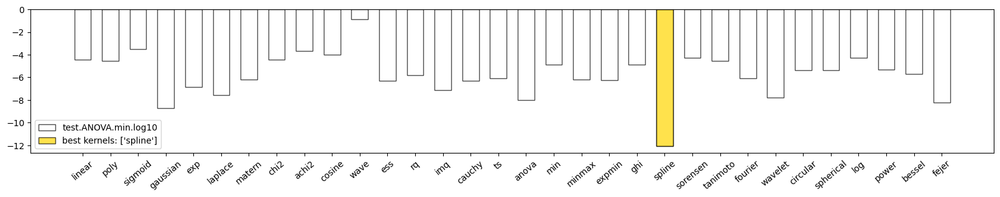

test.ANOVA.min.log10
best kernels: ['spline']
best value: -12.061571732774649


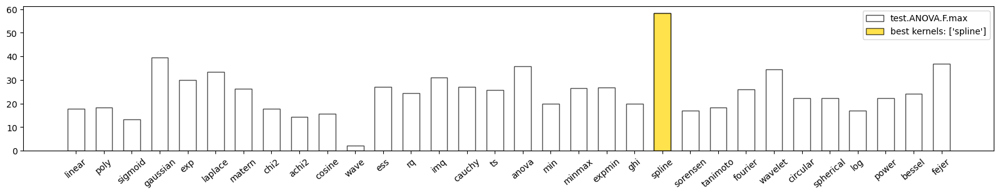

test.ANOVA.F.max
best kernels: ['spline']
best value: 58.33333411967017


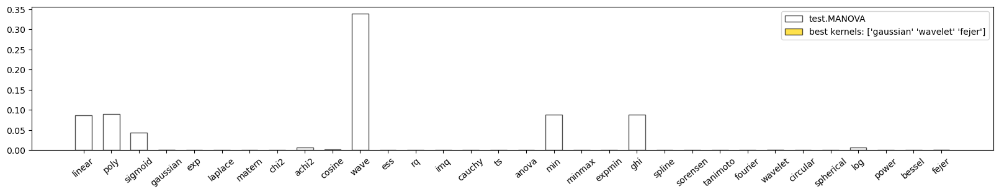

test.MANOVA
best kernels: ['gaussian' 'wavelet' 'fejer']
best value: 2.220446049250313e-16


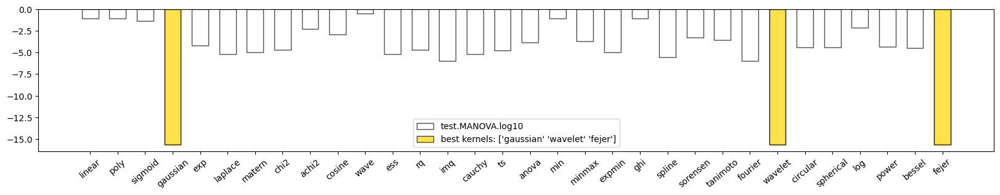

test.MANOVA.log10
best kernels: ['gaussian' 'wavelet' 'fejer']
best value: -15.653559774527022


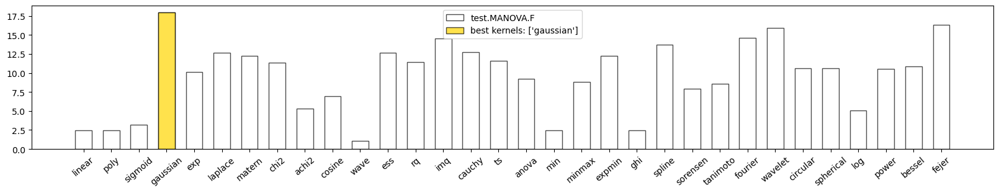

test.MANOVA.F
best kernels: ['gaussian']
best value: 17.963574


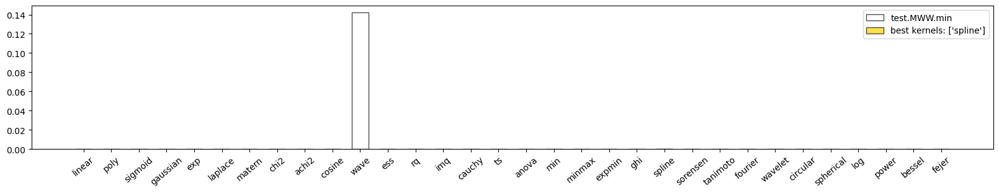

test.MWW.min
best kernels: ['spline']
best value: 1.8062695479089679e-13


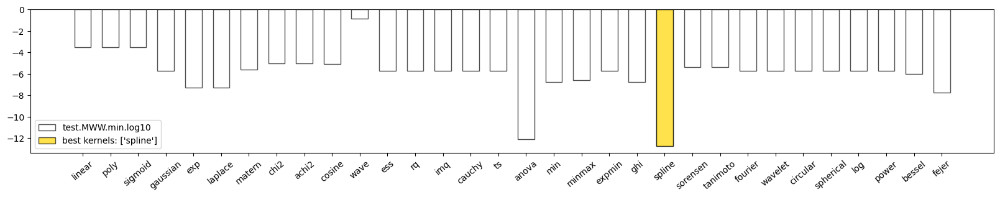

test.MWW.min.log10
best kernels: ['spline']
best value: -12.743217439828479


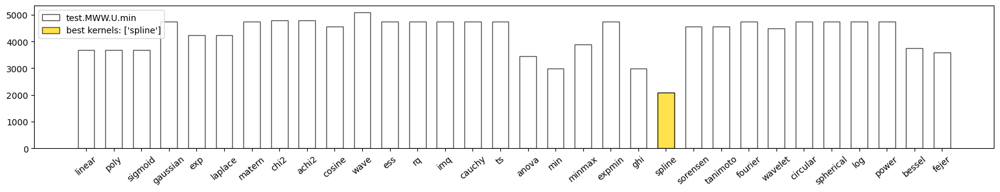

test.MWW.U.min
best kernels: ['spline']
best value: 2092.0


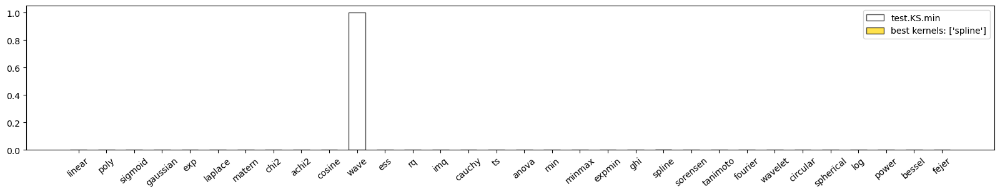

test.KS.min
best kernels: ['spline']
best value: 3.955724636739433e-13


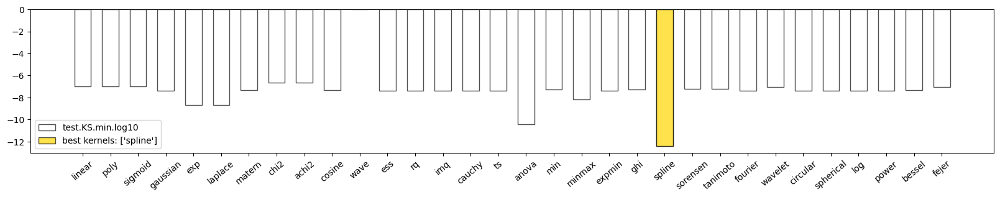

test.KS.min.log10
best kernels: ['spline']
best value: -12.402773947839988


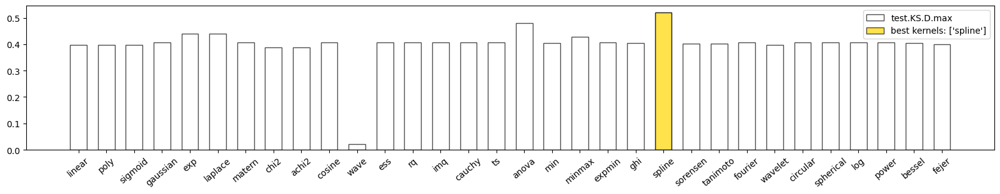

test.KS.D.max
best kernels: ['spline']
best value: 0.5200231035810551


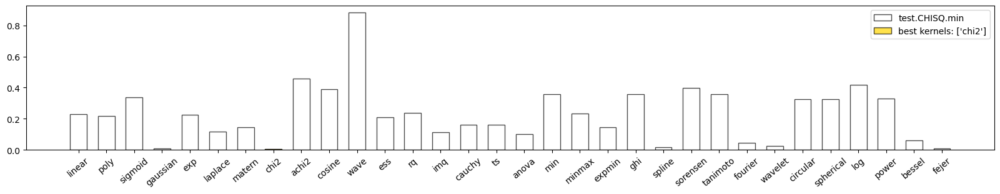

test.CHISQ.min
best kernels: ['chi2']
best value: 0.005885894352887809


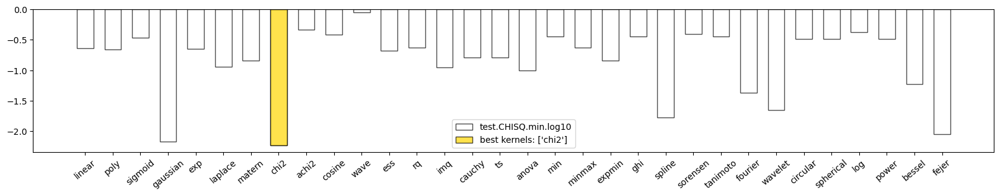

test.CHISQ.min.log10
best kernels: ['chi2']
best value: -2.2301875374062385


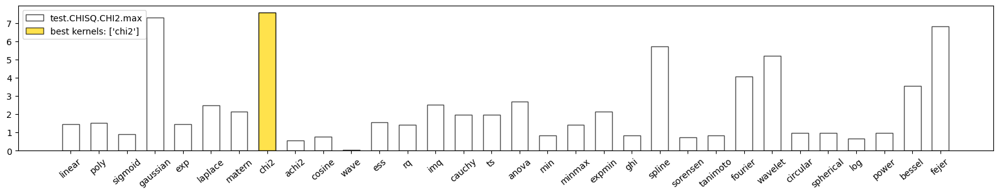

test.CHISQ.CHI2.max
best kernels: ['chi2']
best value: 7.5849087387908245


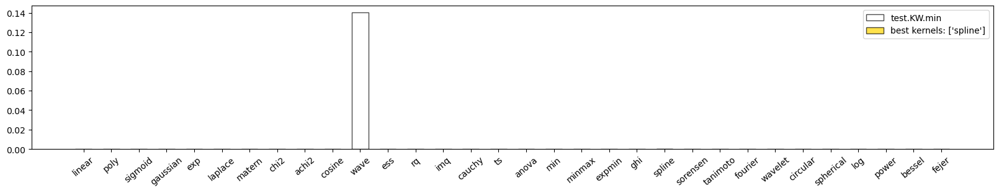

test.KW.min
best kernels: ['spline']
best value: 1.7902741073096906e-13


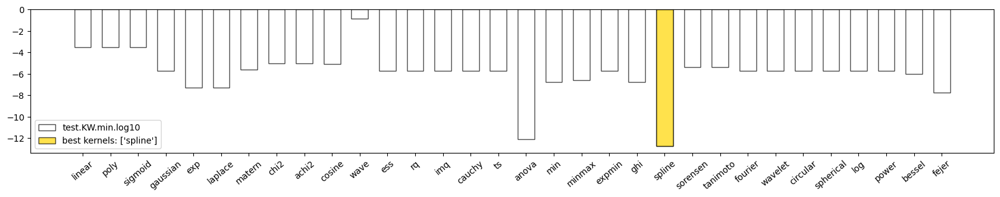

test.KW.min.log10
best kernels: ['spline']
best value: -12.74708046947917


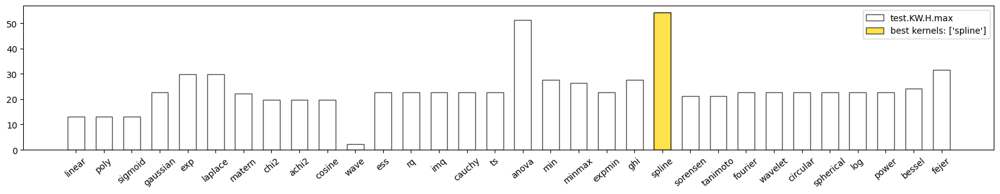

test.KW.H.max
best kernels: ['spline']
best value: 54.22247509259011


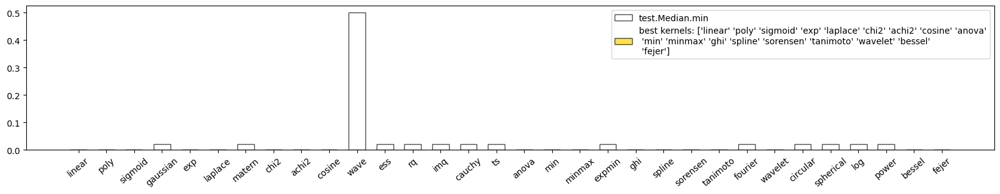

test.Median.min
best kernels: ['linear' 'poly' 'sigmoid' 'exp' 'laplace' 'chi2' 'achi2' 'cosine' 'anova'
 'min' 'minmax' 'ghi' 'spline' 'sorensen' 'tanimoto' 'wavelet' 'bessel'
 'fejer']
best value: 0.0


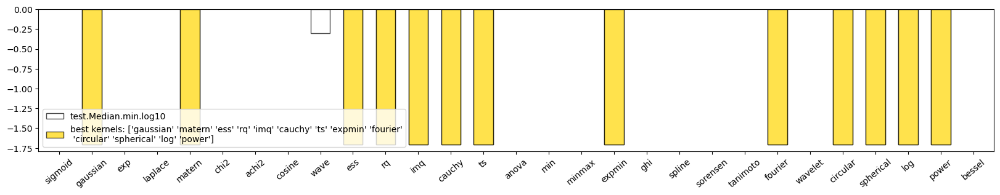

test.Median.min.log10
best kernels: ['gaussian' 'matern' 'ess' 'rq' 'imq' 'cauchy' 'ts' 'expmin' 'fourier'
 'circular' 'spherical' 'log' 'power']
best value: -1.7069017735313663


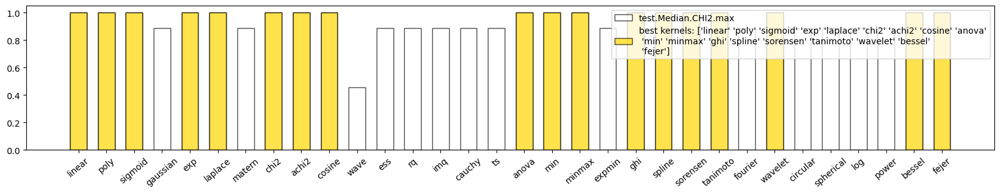

test.Median.CHI2.max
best kernels: ['linear' 'poly' 'sigmoid' 'exp' 'laplace' 'chi2' 'achi2' 'cosine' 'anova'
 'min' 'minmax' 'ghi' 'spline' 'sorensen' 'tanimoto' 'wavelet' 'bessel'
 'fejer']
best value: 1.0


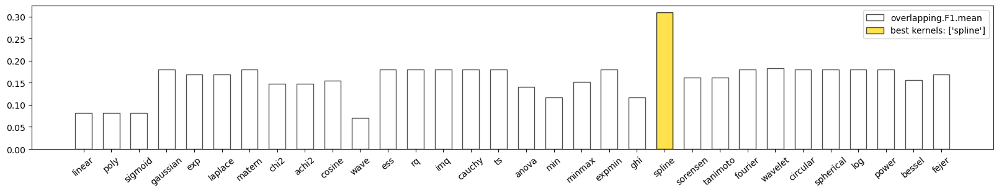

overlapping.F1.mean
best kernels: ['spline']
best value: 0.3093563407001354


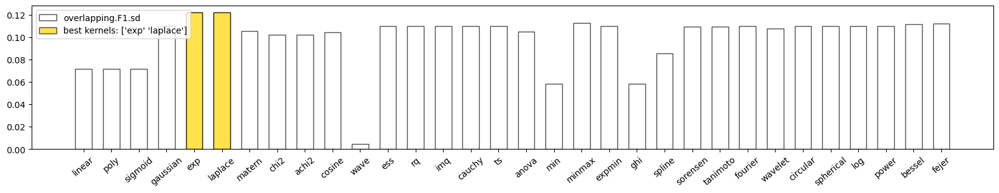

overlapping.F1.sd
best kernels: ['exp' 'laplace']
best value: 0.12209654551012236


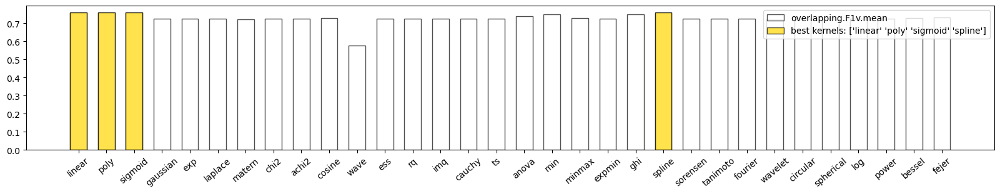

overlapping.F1v.mean
best kernels: ['linear' 'poly' 'sigmoid' 'spline']
best value: 0.7598039215686274


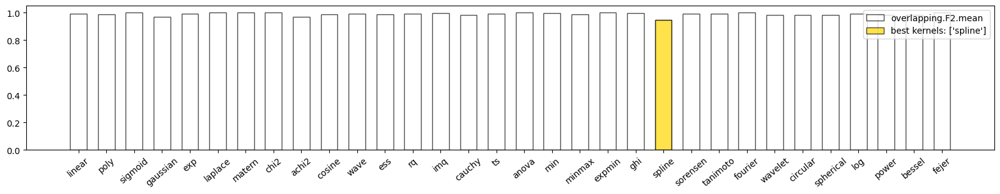

overlapping.F2.mean
best kernels: ['spline']
best value: 0.946078431372549


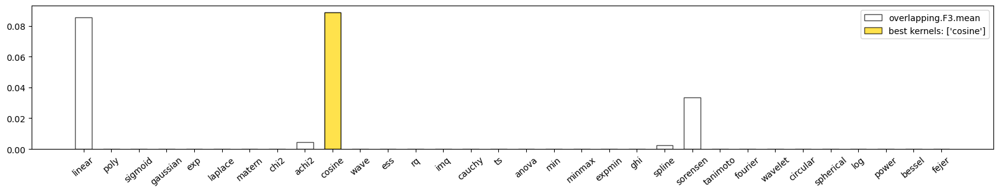

overlapping.F3.mean
best kernels: ['cosine']
best value: 0.08864467805169465
All-NaN slice encountered


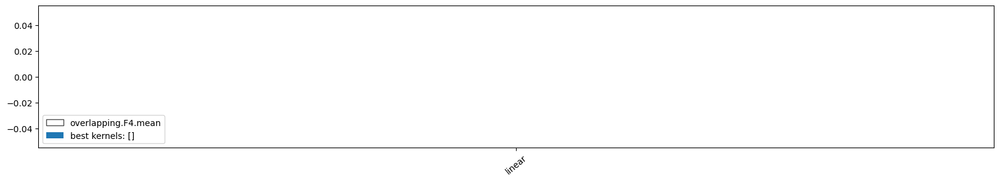

overlapping.F4.mean
best kernels: []
best value: None


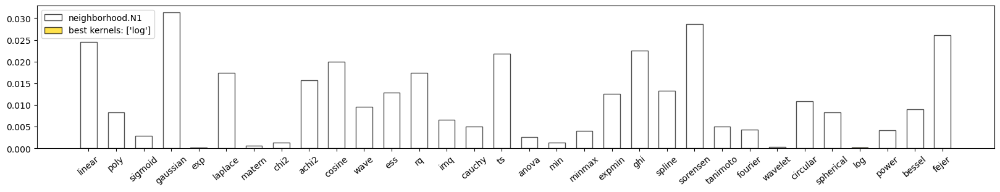

neighborhood.N1
best kernels: ['log']
best value: 0.0001444021309560966


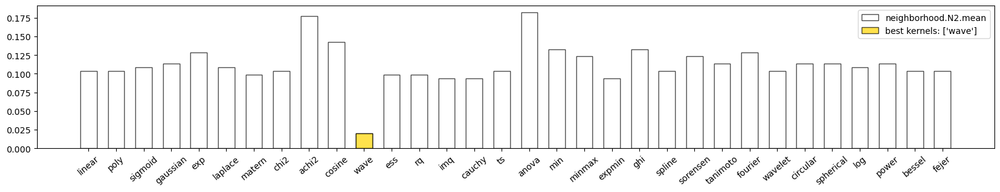

neighborhood.N2.mean
best kernels: ['wave']
best value: 0.019704433497536946


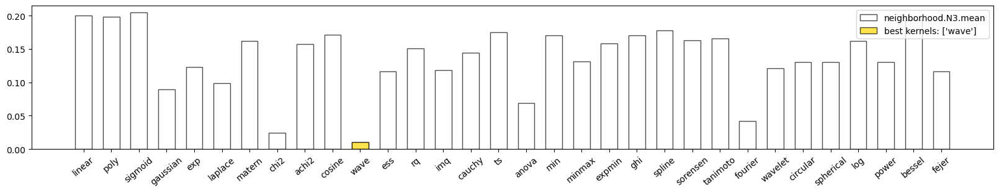

neighborhood.N3.mean
best kernels: ['wave']
best value: 0.009900511928909495


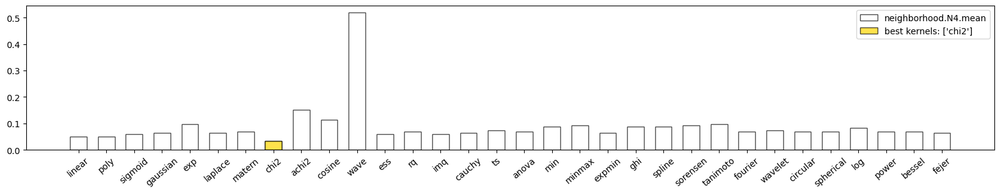

neighborhood.N4.mean
best kernels: ['chi2']
best value: 0.03431372549019608


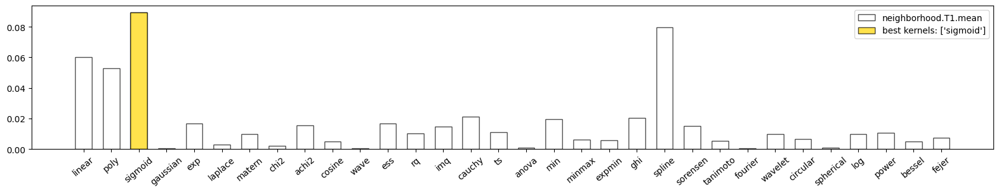

neighborhood.T1.mean
best kernels: ['sigmoid']
best value: 0.08936524864415946


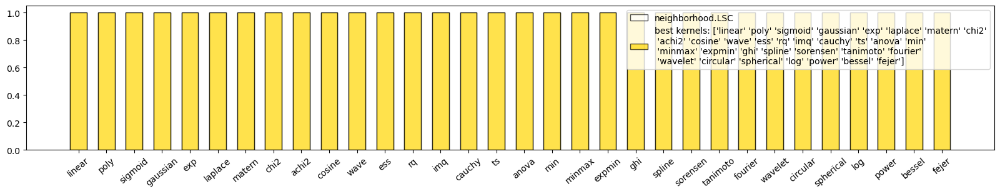

neighborhood.LSC
best kernels: ['linear' 'poly' 'sigmoid' 'gaussian' 'exp' 'laplace' 'matern' 'chi2'
 'achi2' 'cosine' 'wave' 'ess' 'rq' 'imq' 'cauchy' 'ts' 'anova' 'min'
 'minmax' 'expmin' 'ghi' 'spline' 'sorensen' 'tanimoto' 'fourier'
 'wavelet' 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
best value: 1.0


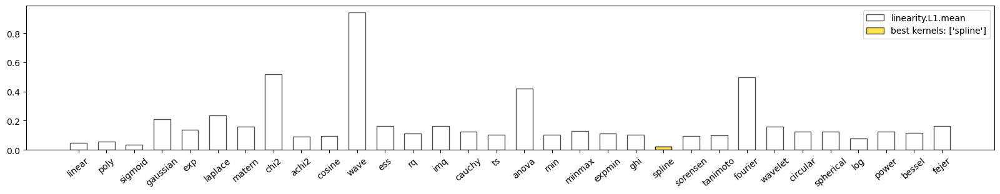

linearity.L1.mean
best kernels: ['spline']
best value: 0.0196078431372549


,linear,poly,sigmoid,gaussian,exp,laplace,matern,chi2,achi2,cosine,wave,ess,rq,imq,cauchy,ts,anova,min,minmax,expmin,ghi,spline,sorensen,tanimoto,fourier,wavelet,circular,spherical,log,power,bessel,fejer,best kernel(s)
classification.ACC,0.995,0.995,0.961,1.0,1.0,1.0,1.0,1.0,0.995,1.0,0.52,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.98,0.995,0.995,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,['gaussian' 'exp' 'laplace' 'matern' 'chi2' 'cosine' 'ess' 'rq' 'imq' 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin' 'ghi' 'fourier' 'wavelet' 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
classification.Kappa,0.99,0.99,0.921,1.0,1.0,1.0,1.0,1.0,0.99,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.961,0.99,0.99,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,['gaussian' 'exp' 'laplace' 'matern' 'chi2' 'cosine' 'ess' 'rq' 'imq' 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin' 'ghi' 'fourier' 'wavelet' 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
classification.F1_Score,0.995,0.995,0.963,1.0,1.0,1.0,1.0,1.0,0.995,1.0,0.684,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.981,0.995,0.995,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,['gaussian' 'exp' 'laplace' 'matern' 'chi2' 'cosine' 'ess' 'rq' 'imq' 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin' 'ghi' 'fourier' 'wavelet' 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
classification.Jaccard,0.991,0.991,0.928,1.0,1.0,1.0,1.0,1.0,0.991,1.0,0.52,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.963,0.991,0.991,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,['gaussian' 'exp' 'laplace' 'matern' 'chi2' 'cosine' 'ess' 'rq' 'imq' 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin' 'ghi' 'fourier' 'wavelet' 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
classification.Precision,1.0,1.0,0.954,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.52,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.99,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,['linear' 'poly' 'gaussian' 'exp' 'laplace' 'matern' 'chi2' 'achi2' 'cosine' 'ess' 'rq' 'imq' 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin' 'ghi' 'sorensen' 'tanimoto' 'fourier' 'wavelet' 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
classification.Recall,0.991,0.991,0.972,1.0,1.0,1.0,1.0,1.0,0.991,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.972,0.991,0.991,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,['gaussian' 'exp' 'laplace' 'matern' 'chi2' 'cosine' 'wave' 'ess' 'rq' 'imq' 'cauchy' 'ts' 'anova' 'min' 'minmax' 'expmin' 'ghi' 'fourier' 'wavelet' 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
classification.McNemar,1.0,1.0,0.724,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.617,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,['linear' 'poly' 'achi2' 'sorensen' 'tanimoto']
classification.McNemar.CHI2,0.0,0.0,0.125,inf,inf,inf,inf,inf,0.0,inf,96.01,inf,inf,inf,inf,inf,inf,inf,inf,inf,inf,0.25,0.0,0.0,inf,inf,inf,inf,inf,inf,inf,inf,['wave']
classification.CochranQ,0.317,0.317,0.48,nan,nan,nan,nan,nan,0.317,nan,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.317,0.317,0.317,nan,nan,nan,nan,nan,nan,nan,nan,['sigmoid']
classification.CochranQ.T,1.0,1.0,0.5,nan,nan,nan,nan,nan,1.0,nan,98.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.0,1.0,1.0,nan,nan,nan,nan,nan,nan,nan,nan,['sigmoid']


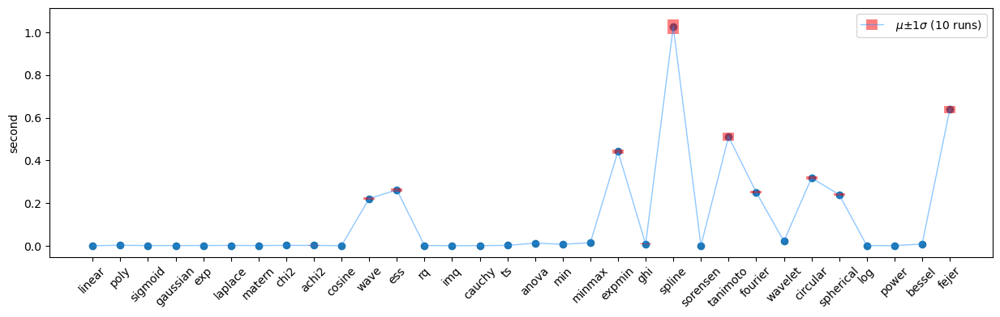

Averaged run time:  {'linear': 0.0005887700000016593, 'poly': 0.0024207799999999224, 'sigmoid': 0.0012466600000209382, 'gaussian': 0.0009132499999850551, 'exp': 0.0015203200000030392, 'laplace': 0.0015924499999925956, 'matern': 0.0011545100000148524, 'chi2': 0.001986829999998463, 'achi2': 0.0017499900000018443, 'cosine': 0.0005557399999929658, 'wave': 0.22084062999999218, 'ess': 0.26200554000000126, 'rq': 0.0013211199999943802, 'imq': 0.000714609999994309, 'cauchy': 0.0006892599999900994, 'ts': 0.0019446799999968789, 'anova': 0.012507760000011104, 'min': 0.00704964000000814, 'minmax': 0.014131099999985963, 'expmin': 0.4424148099999911, 'ghi': 0.007699229999991531, 'spline': 1.0262256800000045, 'sorensen': 0.0006003800000030423, 'tanimoto': 0.5108547900000076, 'fourier': 0.2508867700000053, 'wavelet': 0.020878879999997935, 'circular': 0.3176089200000035, 'spherical': 0.2398965299999986, 'log': 0.000983140000005278, 'power': 0.0006823499999939031, 'bessel': 0.008406729999990148, 'fejer':

In [6]:
analyze_dataset('shihu')

load dataset from 7a47.csv
X.shape (80, 900)  y.shape (80,)


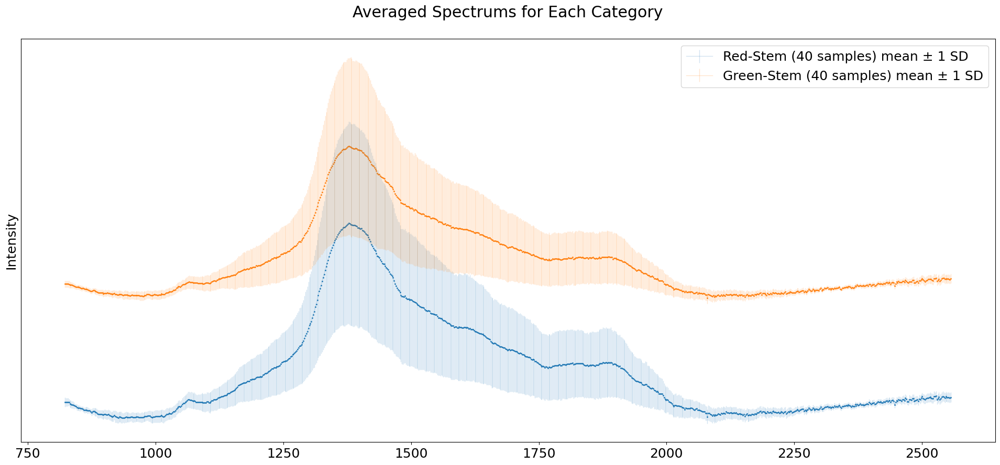

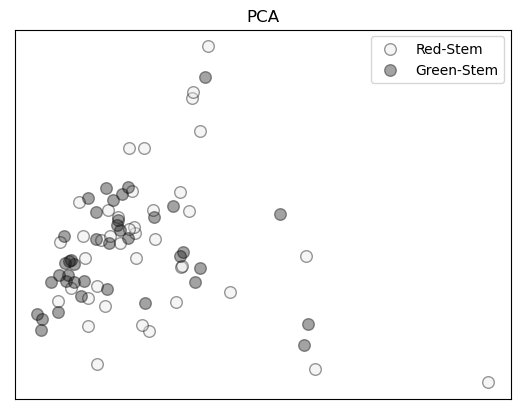

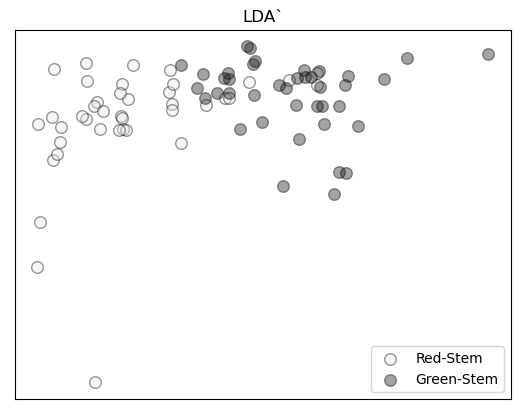

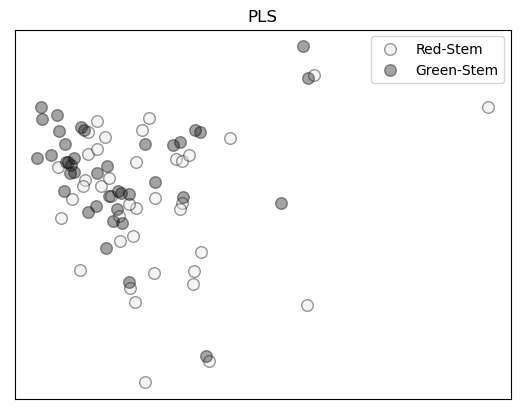

种质鉴别

“红杆种质多花黄精的株高、茎粗、叶宽和叶面积等农艺性状及根茎多糖含量均显著高于绿杆种质”

红杆、绿杆黄精（Polygonatum sibiricum Delar. ex Redoute of Red and Green Stem Type）。
浙江金华莘畈乡。黄精根切片。

类标签：
0 - 红杆
1 - 绿杆

拉曼参数：
波长：785nm
激发功率：30mw
曝光时间（Exposure time）：0.2s
扫描次数（Number of exposures）：200次"


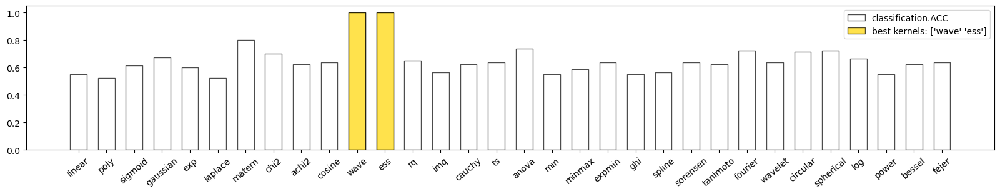

classification.ACC
best kernels: ['wave' 'ess']
best value: 1.0


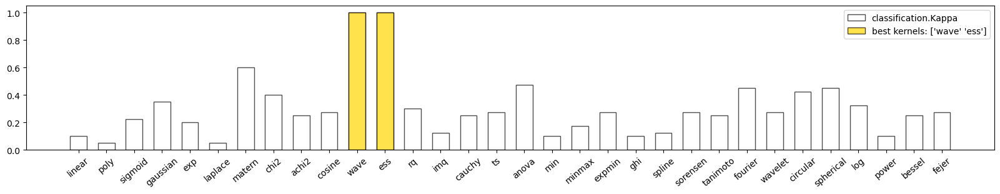

classification.Kappa
best kernels: ['wave' 'ess']
best value: 1.0


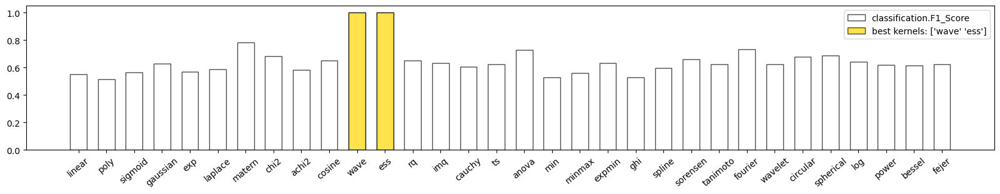

classification.F1_Score
best kernels: ['wave' 'ess']
best value: 1.0


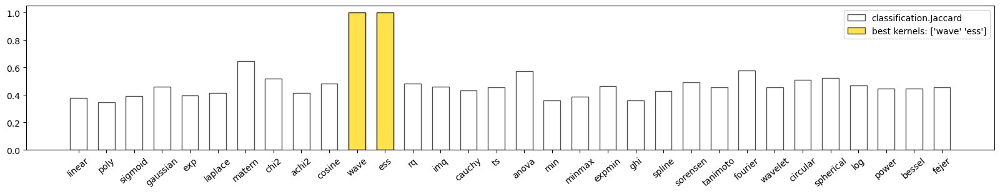

classification.Jaccard
best kernels: ['wave' 'ess']
best value: 1.0


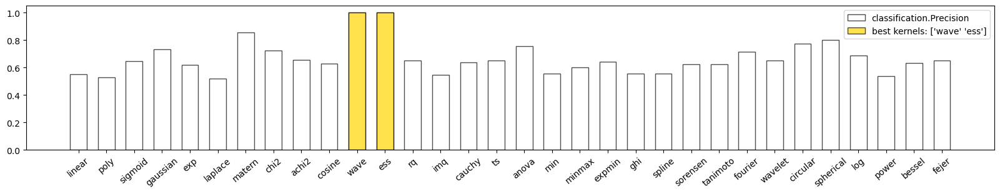

classification.Precision
best kernels: ['wave' 'ess']
best value: 1.0


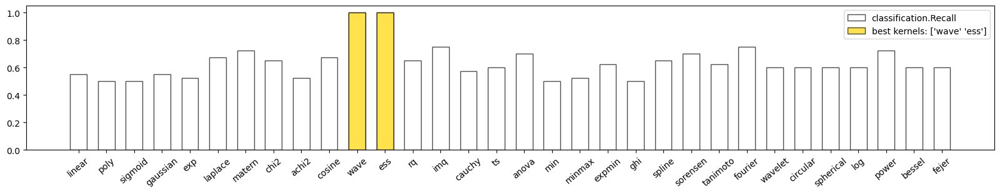

classification.Recall
best kernels: ['wave' 'ess']
best value: 1.0


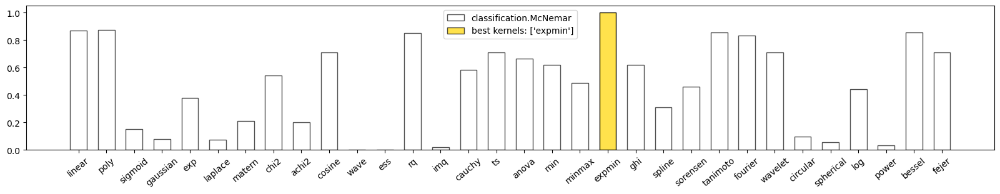

classification.McNemar
best kernels: ['expmin']
best value: 1.0


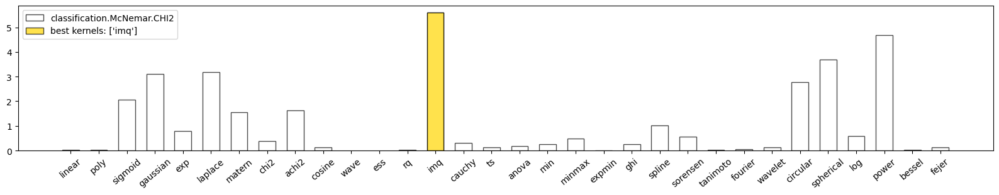

classification.McNemar.CHI2
best kernels: ['imq']
best value: 5.6


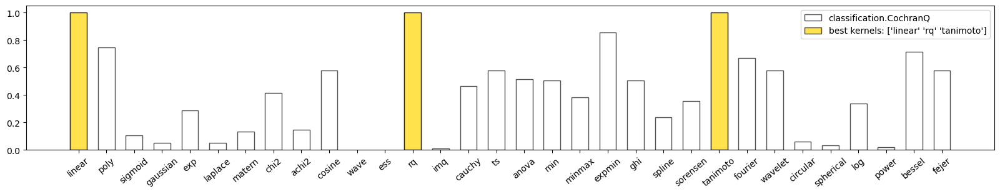

classification.CochranQ
best kernels: ['linear' 'rq' 'tanimoto']
best value: 1.0


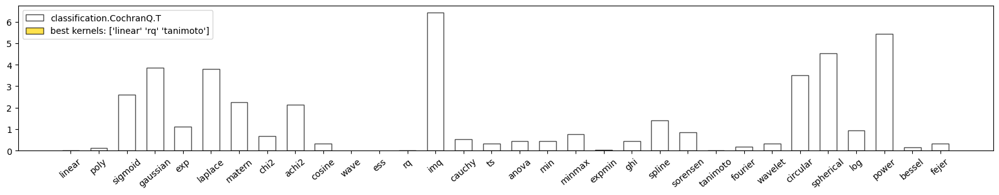

classification.CochranQ.T
best kernels: ['linear' 'rq' 'tanimoto']
best value: 0.0


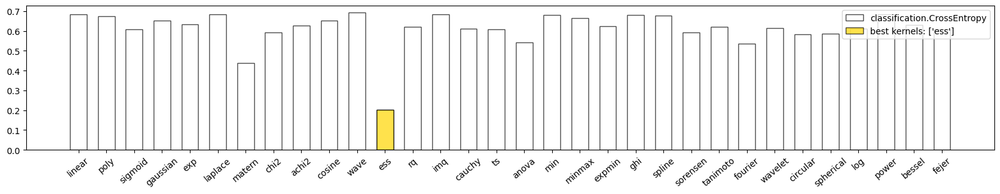

classification.CrossEntropy
best kernels: ['ess']
best value: 0.20125377054897436


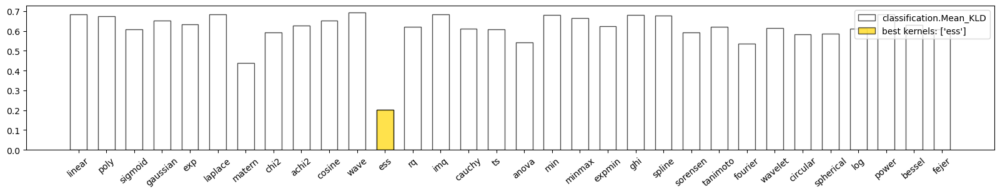

classification.Mean_KLD
best kernels: ['ess']
best value: 0.2012537705489743


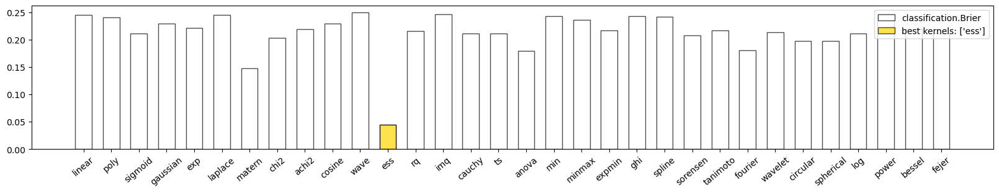

classification.Brier
best kernels: ['ess']
best value: 0.044631950764540344


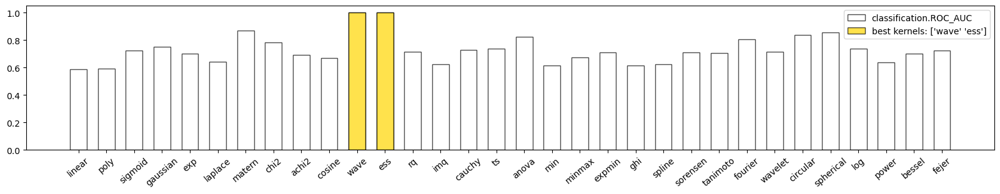

classification.ROC_AUC
best kernels: ['wave' 'ess']
best value: 1.0


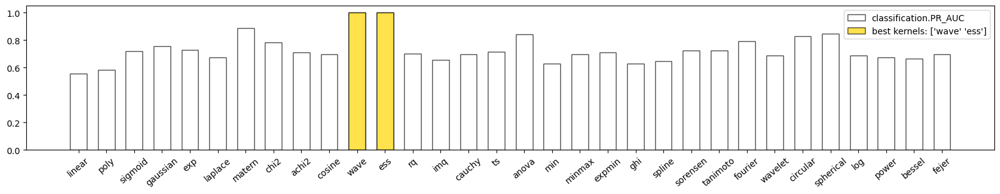

classification.PR_AUC
best kernels: ['wave' 'ess']
best value: 1.0


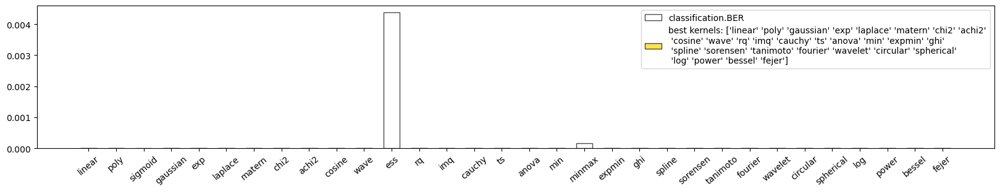

classification.BER
best kernels: ['linear' 'poly' 'gaussian' 'exp' 'laplace' 'matern' 'chi2' 'achi2'
 'cosine' 'wave' 'rq' 'imq' 'cauchy' 'ts' 'anova' 'min' 'expmin' 'ghi'
 'spline' 'sorensen' 'tanimoto' 'fourier' 'wavelet' 'circular' 'spherical'
 'log' 'power' 'bessel' 'fejer']
best value: 0.0


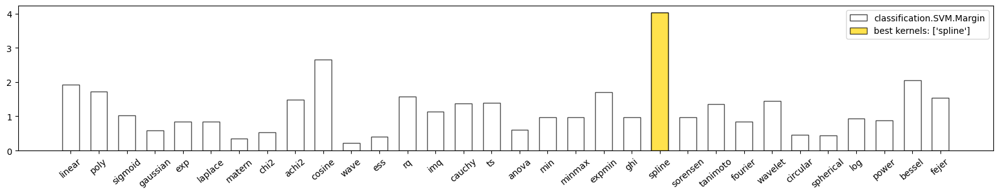

classification.SVM.Margin
best kernels: ['spline']
best value: 4.029445931237478


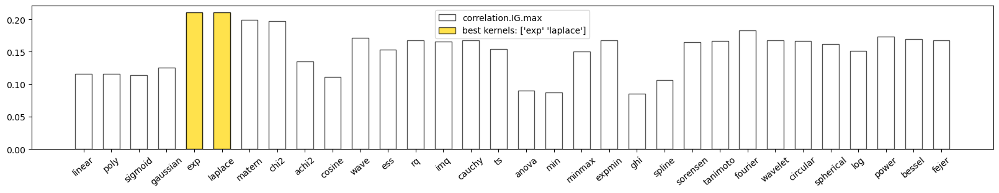

correlation.IG.max
best kernels: ['exp' 'laplace']
best value: 0.21055144424934635


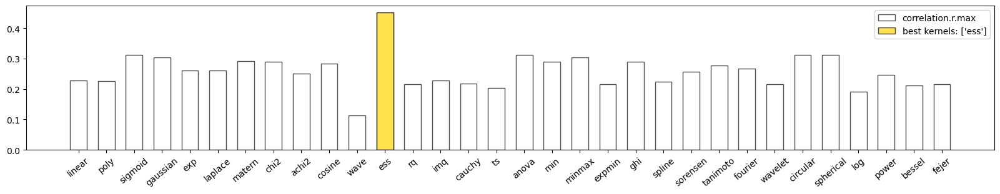

correlation.r.max
best kernels: ['ess']
best value: 0.45197700126628637


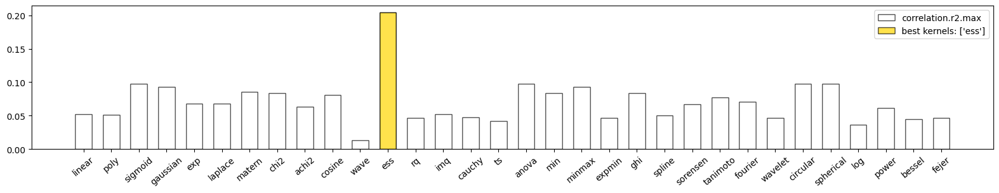

correlation.r2.max
best kernels: ['ess']
best value: 0.20428320967366465


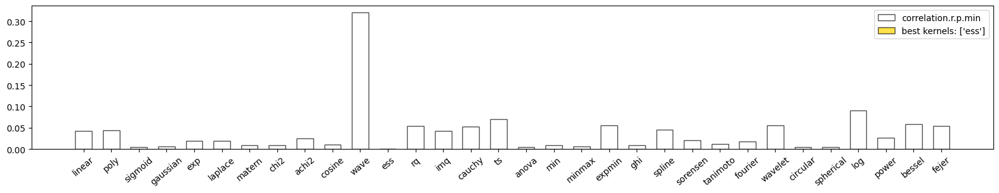

correlation.r.p.min
best kernels: ['ess']
best value: 2.5697067042242693e-05


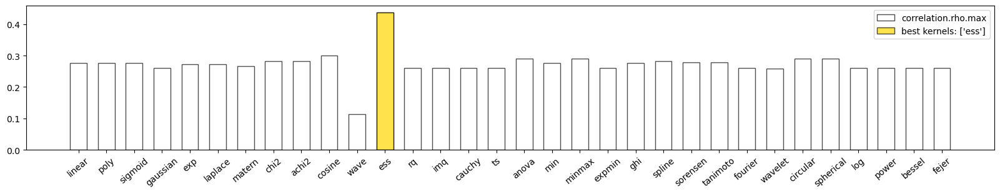

correlation.rho.max
best kernels: ['ess']
best value: 0.4373770003241648


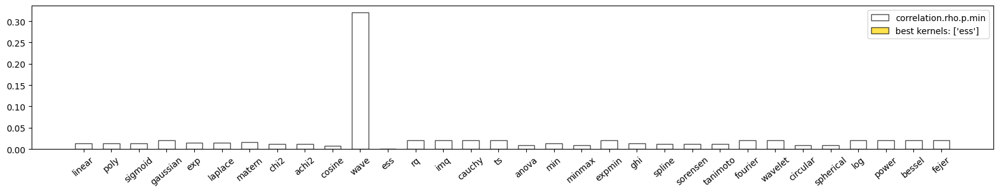

correlation.rho.p.min
best kernels: ['ess']
best value: 4.9754221427367115e-05


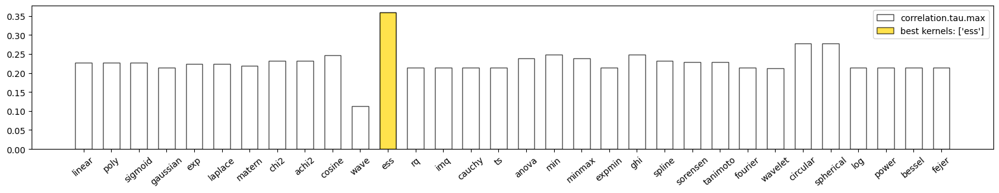

correlation.tau.max
best kernels: ['ess']
best value: 0.35934187381723415


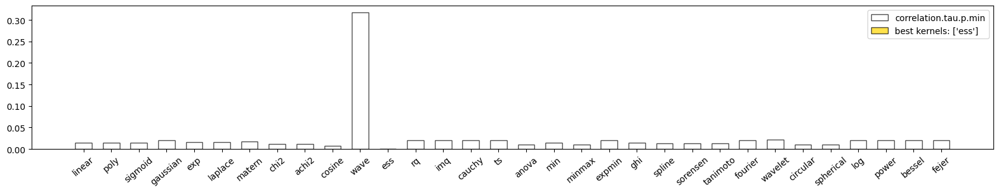

correlation.tau.p.min
best kernels: ['ess']
best value: 0.00010128540297571072


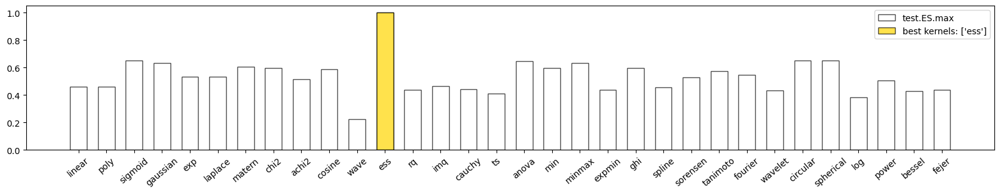

test.ES.max
best kernels: ['ess']
best value: 1.0006204601217805


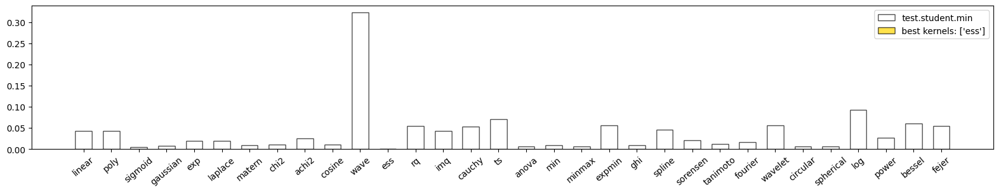

test.student.min
best kernels: ['ess']
best value: 3.0109506204788958e-05


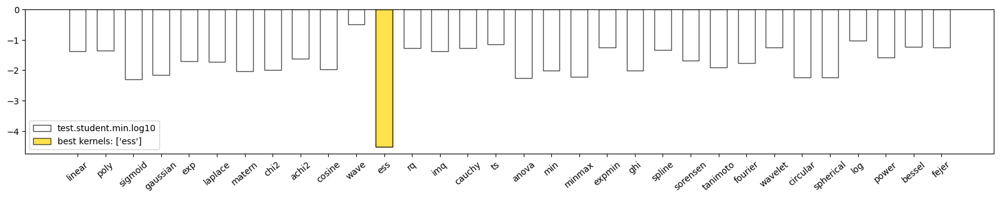

test.student.min.log10
best kernels: ['ess']
best value: -4.521296366848378


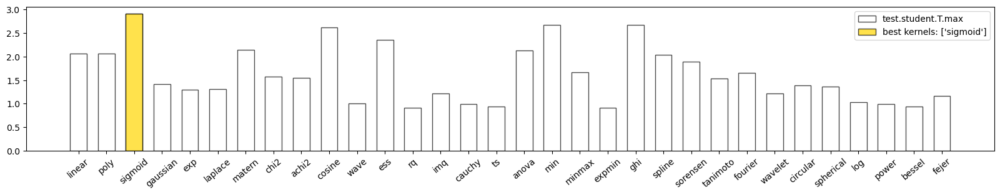

test.student.T.max
best kernels: ['sigmoid']
best value: 2.907454576453303


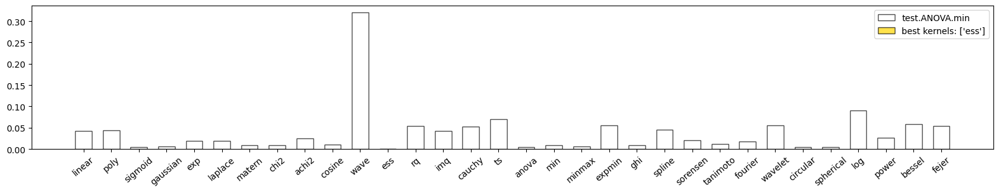

test.ANOVA.min
best kernels: ['ess']
best value: 2.5697067042242476e-05


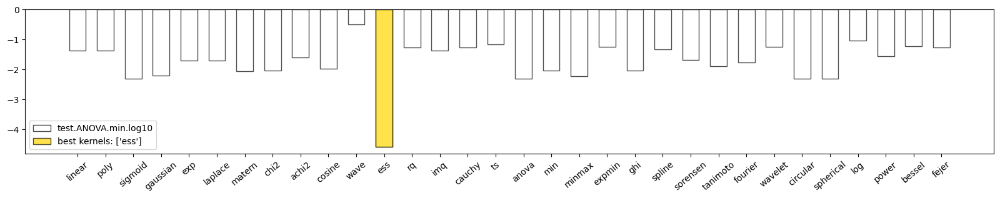

test.ANOVA.min.log10
best kernels: ['ess']
best value: -4.590116442429728


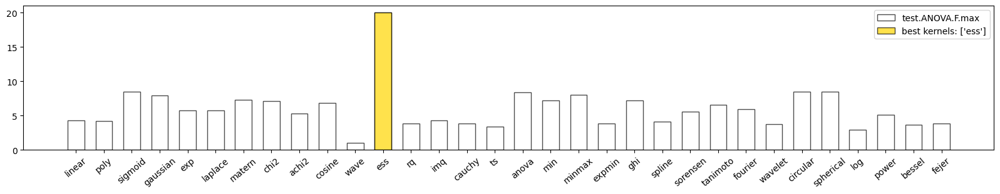

test.ANOVA.F.max
best kernels: ['ess']
best value: 20.024826104286472


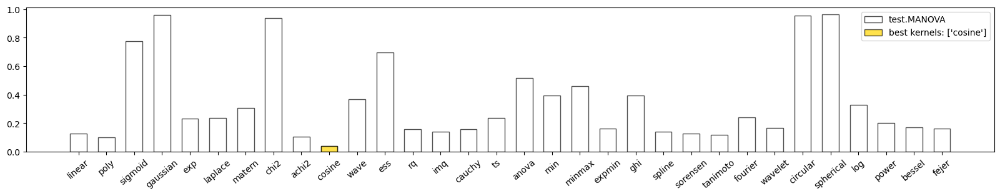

test.MANOVA
best kernels: ['cosine']
best value: 0.038593


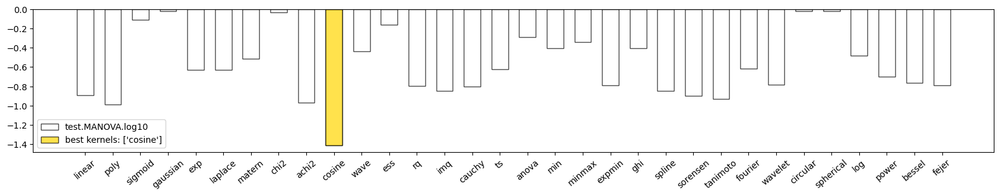

test.MANOVA.log10
best kernels: ['cosine']
best value: -1.4134914605370503


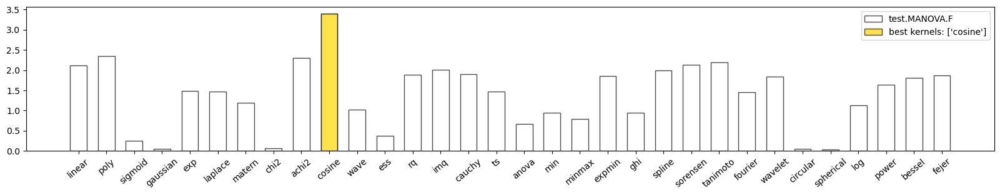

test.MANOVA.F
best kernels: ['cosine']
best value: 3.396214


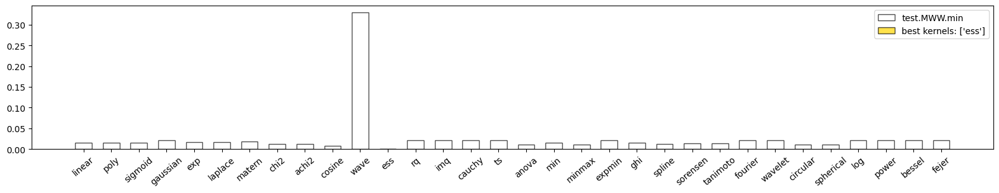

test.MWW.min
best kernels: ['ess']
best value: 0.00010331124934592215


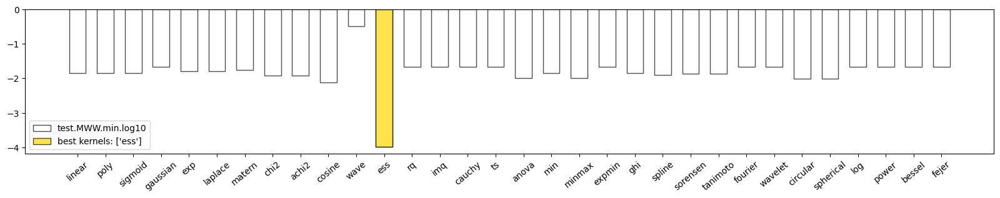

test.MWW.min.log10
best kernels: ['ess']
best value: -3.985852386487525


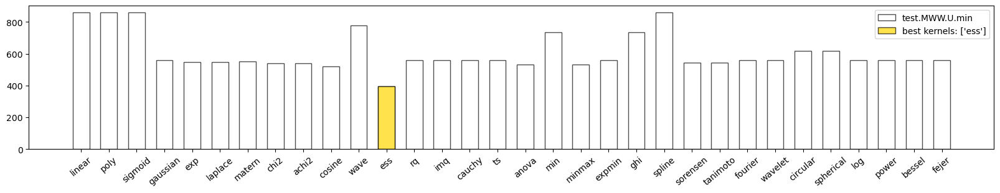

test.MWW.U.min
best kernels: ['ess']
best value: 396.0


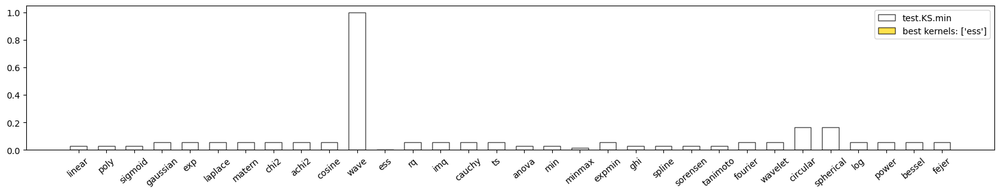

test.KS.min
best kernels: ['ess']
best value: 0.0012708143485281624


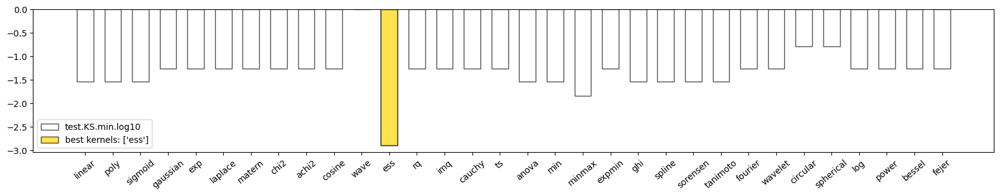

test.KS.min.log10
best kernels: ['ess']
best value: -2.8959178902790854


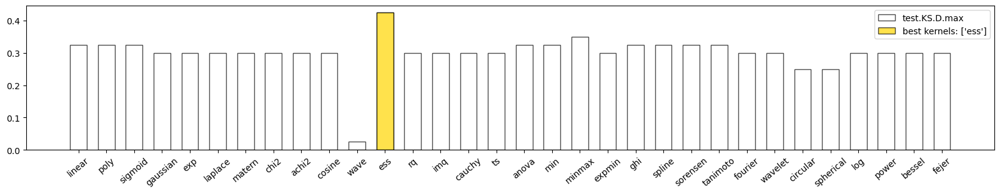

test.KS.D.max
best kernels: ['ess']
best value: 0.425


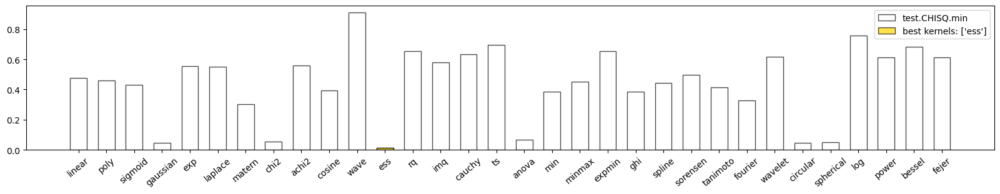

test.CHISQ.min
best kernels: ['ess']
best value: 0.012028364611842354


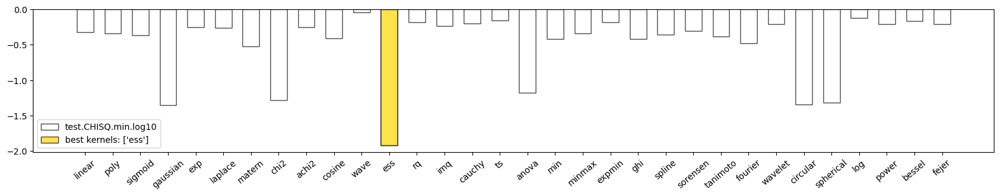

test.CHISQ.min.log10
best kernels: ['ess']
best value: -1.919793415746848


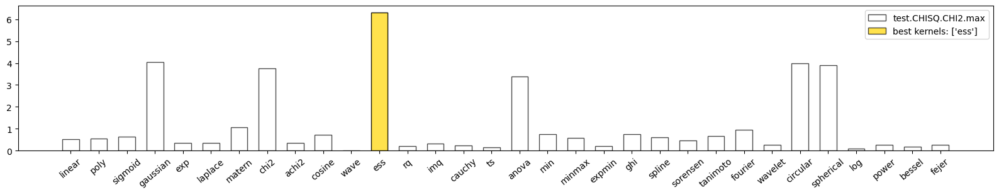

test.CHISQ.CHI2.max
best kernels: ['ess']
best value: 6.30668338107803


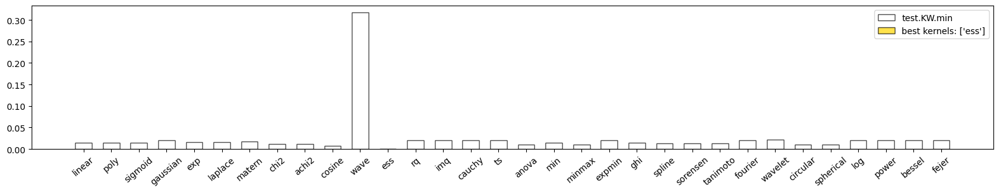

test.KW.min
best kernels: ['ess']
best value: 0.00010128540297571062


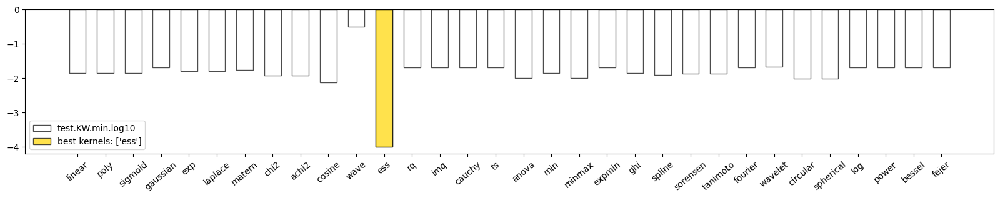

test.KW.min.log10
best kernels: ['ess']
best value: -3.9944531396731815


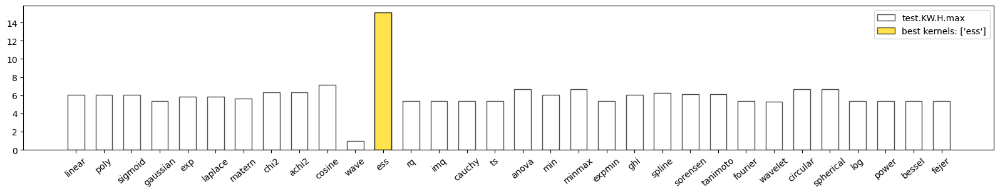

test.KW.H.max
best kernels: ['ess']
best value: 15.112592592592591


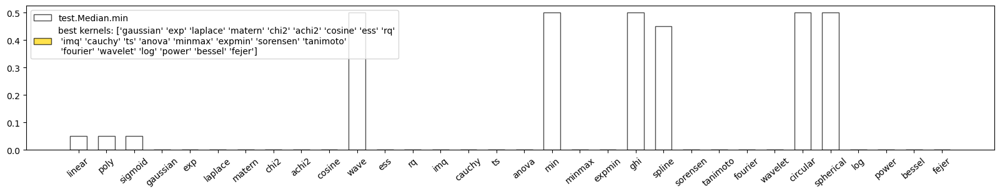

test.Median.min
best kernels: ['gaussian' 'exp' 'laplace' 'matern' 'chi2' 'achi2' 'cosine' 'ess' 'rq'
 'imq' 'cauchy' 'ts' 'anova' 'minmax' 'expmin' 'sorensen' 'tanimoto'
 'fourier' 'wavelet' 'log' 'power' 'bessel' 'fejer']
best value: 0.0


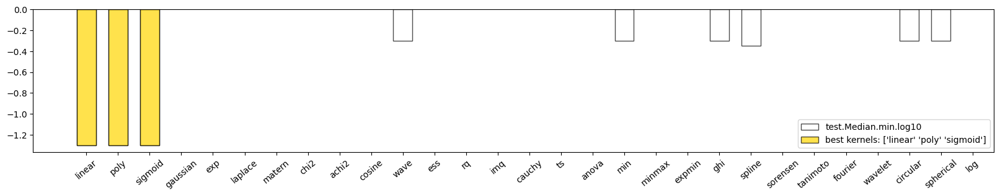

test.Median.min.log10
best kernels: ['linear' 'poly' 'sigmoid']
best value: -1.3010299956639813


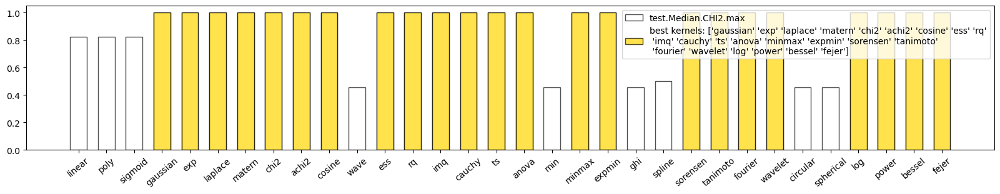

test.Median.CHI2.max
best kernels: ['gaussian' 'exp' 'laplace' 'matern' 'chi2' 'achi2' 'cosine' 'ess' 'rq'
 'imq' 'cauchy' 'ts' 'anova' 'minmax' 'expmin' 'sorensen' 'tanimoto'
 'fourier' 'wavelet' 'log' 'power' 'bessel' 'fejer']
best value: 1.0


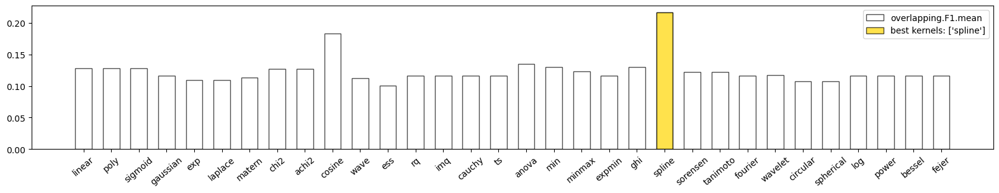

overlapping.F1.mean
best kernels: ['spline']
best value: 0.2166315291209539


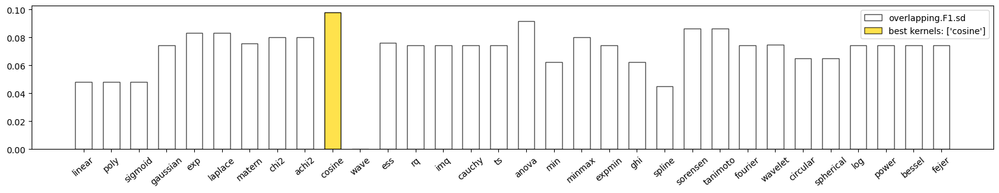

overlapping.F1.sd
best kernels: ['cosine']
best value: 0.09792008642510397


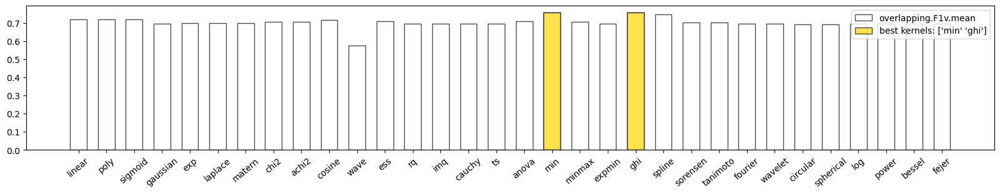

overlapping.F1v.mean
best kernels: ['min' 'ghi']
best value: 0.7565625


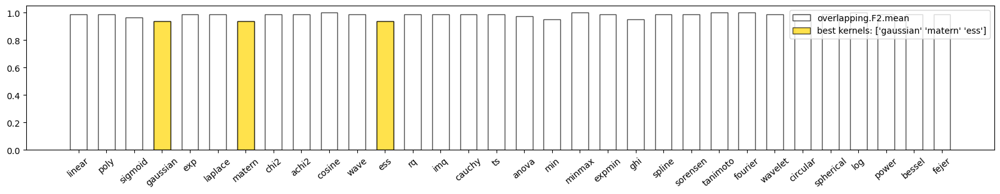

overlapping.F2.mean
best kernels: ['gaussian' 'matern' 'ess']
best value: 0.9375


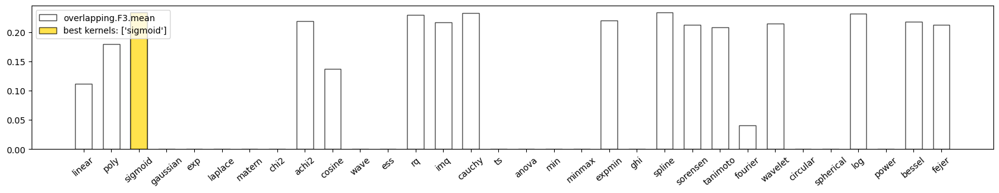

overlapping.F3.mean
best kernels: ['sigmoid']
best value: 0.23353831464055838
All-NaN slice encountered


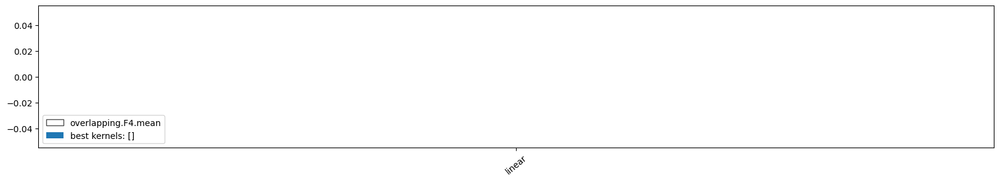

overlapping.F4.mean
best kernels: []
best value: None


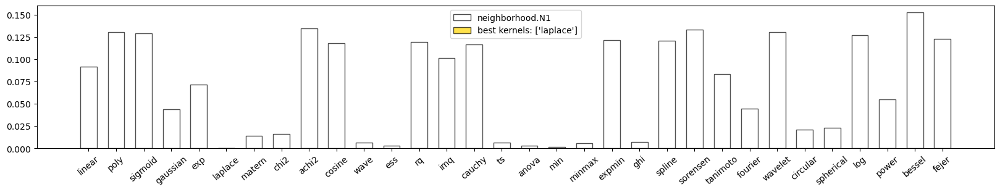

neighborhood.N1
best kernels: ['laplace']
best value: 2.41860630815613e-05


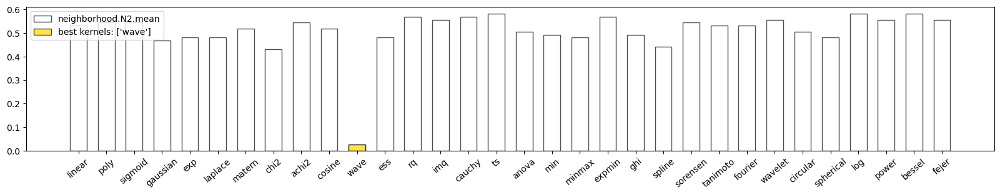

neighborhood.N2.mean
best kernels: ['wave']
best value: 0.02531645569620253


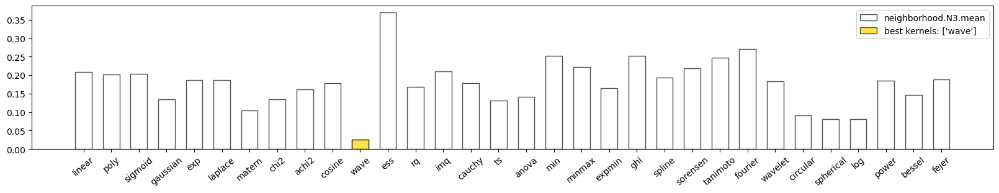

neighborhood.N3.mean
best kernels: ['wave']
best value: 0.025


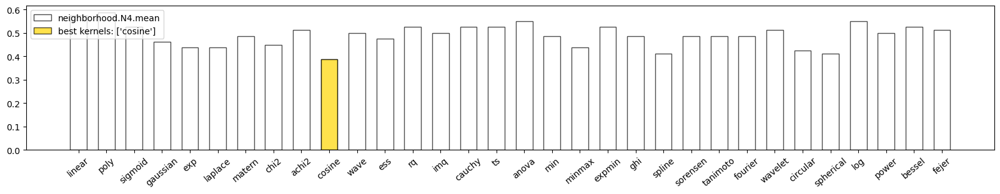

neighborhood.N4.mean
best kernels: ['cosine']
best value: 0.3875


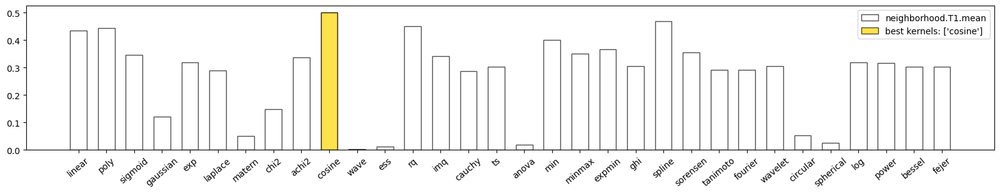

neighborhood.T1.mean
best kernels: ['cosine']
best value: 0.5001209366064404


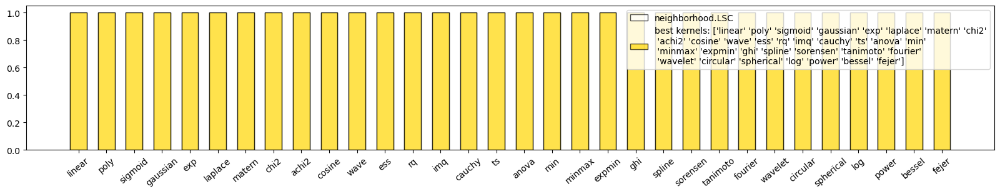

neighborhood.LSC
best kernels: ['linear' 'poly' 'sigmoid' 'gaussian' 'exp' 'laplace' 'matern' 'chi2'
 'achi2' 'cosine' 'wave' 'ess' 'rq' 'imq' 'cauchy' 'ts' 'anova' 'min'
 'minmax' 'expmin' 'ghi' 'spline' 'sorensen' 'tanimoto' 'fourier'
 'wavelet' 'circular' 'spherical' 'log' 'power' 'bessel' 'fejer']
best value: 1.0


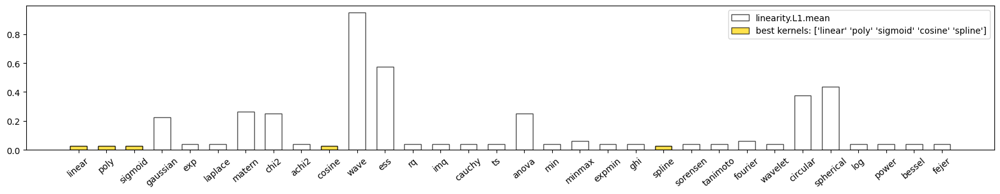

linearity.L1.mean
best kernels: ['linear' 'poly' 'sigmoid' 'cosine' 'spline']
best value: 0.025


,linear,poly,sigmoid,gaussian,exp,laplace,matern,chi2,achi2,cosine,wave,ess,rq,imq,cauchy,ts,anova,min,minmax,expmin,ghi,spline,sorensen,tanimoto,fourier,wavelet,circular,spherical,log,power,bessel,fejer,best kernel(s)
classification.ACC,0.55,0.525,0.612,0.675,0.6,0.525,0.8,0.7,0.625,0.638,1.0,1.0,0.65,0.562,0.625,0.638,0.738,0.55,0.588,0.638,0.55,0.562,0.638,0.625,0.725,0.638,0.712,0.725,0.662,0.55,0.625,0.638,['wave' 'ess']
classification.Kappa,0.1,0.05,0.225,0.35,0.2,0.05,0.6,0.4,0.25,0.275,1.0,1.0,0.3,0.125,0.25,0.275,0.475,0.1,0.175,0.275,0.1,0.125,0.275,0.25,0.45,0.275,0.425,0.45,0.325,0.1,0.25,0.275,['wave' 'ess']
classification.F1_Score,0.55,0.513,0.563,0.629,0.568,0.587,0.784,0.684,0.583,0.651,1.0,1.0,0.65,0.632,0.605,0.623,0.727,0.526,0.56,0.633,0.526,0.598,0.659,0.625,0.732,0.623,0.676,0.686,0.64,0.617,0.615,0.623,['wave' 'ess']
classification.Jaccard,0.379,0.345,0.392,0.458,0.396,0.415,0.644,0.52,0.412,0.482,1.0,1.0,0.481,0.462,0.434,0.453,0.571,0.357,0.389,0.463,0.357,0.426,0.491,0.455,0.577,0.453,0.511,0.522,0.471,0.446,0.444,0.453,['wave' 'ess']
classification.Precision,0.55,0.526,0.645,0.733,0.618,0.519,0.853,0.722,0.656,0.628,1.0,1.0,0.65,0.545,0.639,0.649,0.757,0.556,0.6,0.641,0.556,0.553,0.622,0.625,0.714,0.649,0.774,0.8,0.686,0.537,0.632,0.649,['wave' 'ess']
classification.Recall,0.55,0.5,0.5,0.55,0.525,0.675,0.725,0.65,0.525,0.675,1.0,1.0,0.65,0.75,0.575,0.6,0.7,0.5,0.525,0.625,0.5,0.65,0.7,0.625,0.75,0.6,0.6,0.6,0.6,0.725,0.6,0.6,['wave' 'ess']
classification.McNemar,0.868,0.871,0.151,0.078,0.377,0.074,0.211,0.54,0.201,0.71,0.0,0.0,0.85,0.018,0.584,0.71,0.663,0.617,0.486,1.0,0.617,0.31,0.458,0.855,0.831,0.71,0.095,0.055,0.441,0.03,0.855,0.71,['expmin']
classification.McNemar.CHI2,0.028,0.026,2.065,3.115,0.781,3.184,1.562,0.375,1.633,0.138,inf,inf,0.036,5.6,0.3,0.138,0.19,0.25,0.485,0.0,0.25,1.029,0.552,0.033,0.045,0.138,2.783,3.682,0.593,4.694,0.033,0.138,['imq']
classification.CochranQ,1.0,0.746,0.106,0.05,0.289,0.052,0.134,0.414,0.144,0.577,nan,nan,1.0,0.011,0.465,0.577,0.513,0.505,0.384,0.853,0.505,0.237,0.353,1.0,0.67,0.577,0.061,0.033,0.336,0.02,0.715,0.577,['linear' 'rq' 'tanimoto']
classification.CochranQ.T,0.0,0.105,2.613,3.846,1.125,3.789,2.25,0.667,2.133,0.31,nan,nan,0.0,6.429,0.533,0.31,0.429,0.444,0.758,0.034,0.444,1.4,0.862,0.0,0.182,0.31,3.522,4.545,0.926,5.444,0.133,0.31,['linear' 'rq' 'tanimoto']


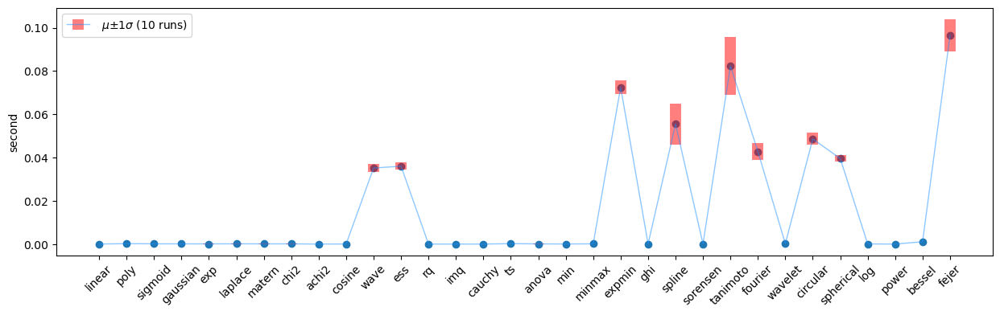

Averaged run time:  {'linear': 8.745999999746346e-05, 'poly': 0.0002630300000078023, 'sigmoid': 0.0001807699999972101, 'gaussian': 0.00016994999999724313, 'exp': 0.000149629999998524, 'laplace': 0.00019060000001900335, 'matern': 0.00016692999997758307, 'chi2': 0.000161150000019461, 'achi2': 7.679000003690817e-05, 'cosine': 0.00010710999997627368, 'wave': 0.03520597999998927, 'ess': 0.03602660000000242, 'rq': 6.377999999358508e-05, 'imq': 7.848999995303529e-05, 'cauchy': 7.450000000517321e-05, 'ts': 0.00026262999997470613, 'anova': 0.00014780999999857157, 'min': 0.00010167999998884625, 'minmax': 0.0001886000000013155, 'expmin': 0.07245173000000023, 'ghi': 0.00011811000002808214, 'spline': 0.05552839999998014, 'sorensen': 9.83500000074855e-05, 'tanimoto': 0.08240205999996988, 'fourier': 0.0428275299999882, 'wavelet': 0.00025835000001279697, 'circular': 0.048639809999997397, 'spherical': 0.0395978300000138, 'log': 0.0001282200000218836, 'power': 7.824000001619425e-05, 'bessel': 0.00112427

In [7]:
analyze_dataset('huangjing')

load dataset from 7345.csv
Use classes: [0, 3], remapped to [0, 1]
X.shape (153, 3000)  y.shape (153,)


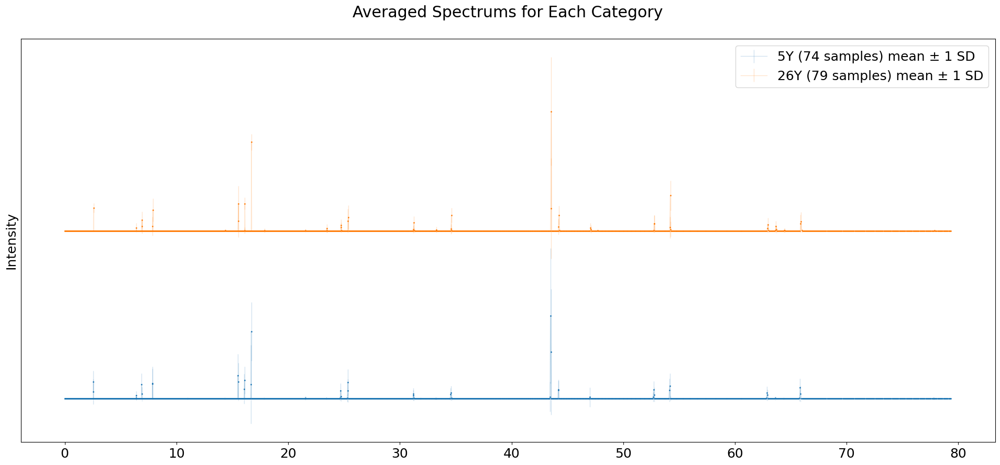

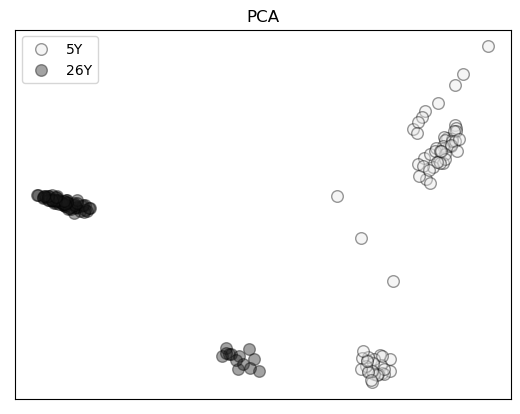

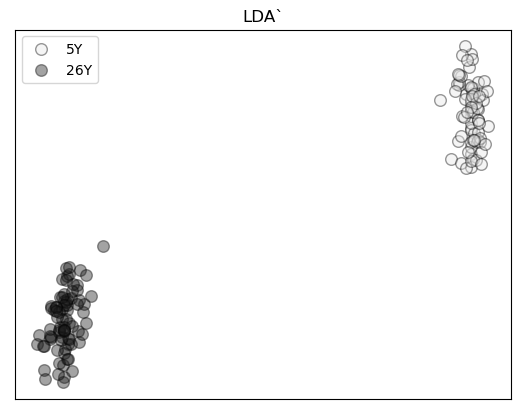

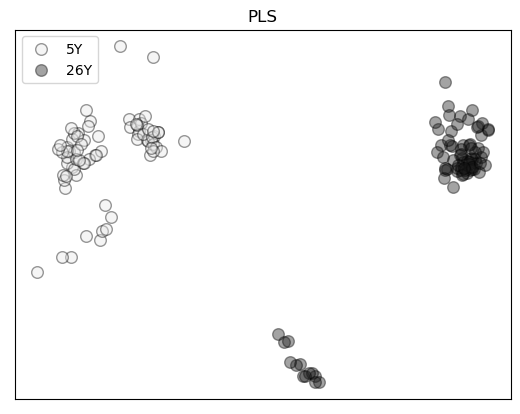

古井贡酒不同年份白酒 SPI-MS of Gujing Tribute wine of different vintages

["5年","8年","16年","26年"]
KW Exception:  All numbers are identical in kruskal
MedianTest Exception:  All values are below the grand median (0.0).


In [ ]:
analyze_dataset('vintage')

</br></br><hr/></br></br>

# Appendix

## linear kernel. 

Some algorithms with a preceding linear kernel equal to their non-kernel counterparts, e.g., linear-kernel-PCA is the same as vanilla PCA.

Verify linear-kernel-PCA equals vanilla PCA

In [ ]:
from sklearn.decomposition import KernelPCA
import matplotlib.pyplot as plt
from qsi.vis import plotComponents2D

X, y, X_names, desc, labels = io.load_dataset('huangjing2', x_range=list(range(400, 1300)), shift = 2000, display=True)

transformer = KernelPCA(n_components=2, kernel='linear')
X_kpca = transformer.fit_transform(X)
# plt.scatter(X_kpca[:,0], X_kpca[:,1]
plotComponents2D(X_kpca, y)
plt.title('linear-kernel-PCA')
plt.show()

It's identical to the PCA plot.

## Wave kernel

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize = (10,4))

for s in [1, 2, 3.14]:

    x = np.linspace(-30,30,1000) #np.linspace(-1/q,1/q,100)
    Y = s/x * np.sin(x/s)
    plt.plot(x,Y,label = 's='+str(s))
    
plt.legend()

## Draw the inner function of Fourier kerenl

In [ ]:
q = 0.5

plt.figure(figsize = (10,4))

for q in [0.3, 0.5, 0.7]:

    x = np.linspace(-3.14,3.14,100) #np.linspace(-1/q,1/q,100)
    H = (1- q ** 2) / (2.*(1. - 2.*q * np.cos(x) + q ** 2))
    plt.plot(x,H,label = 'q='+str(q))
    
plt.legend()

## Draw the spherical kernel against the pair-wise distance.

In [ ]:
plt.figure(figsize = (10,4))

x = np.linspace(0,1,100) #np.linspace(-1/q,1/q,100)
x2 = list(np.linspace(1,2,100))
Y = list(1 - 3/2*x + 1/2*(x)**3)
Y2 = [0]*100
plt.plot(list(x)+x2,Y+Y2, label = r'$1 - \frac{3}{2}{d} + \frac{1}{2} { d }^3$, if d < 1') 
plt.legend()

## Circular kernel

$k(x, y) = \frac{2}{\pi} \arccos ( \frac{ \lVert x-y \rVert}{\sigma}) - \frac{2}{\pi} \frac{ \lVert x-y \rVert}{\sigma} \sqrt{1 - {\left( \frac{ \lVert x-y \rVert}{\sigma} \right)}^2 } $

In [ ]:
import math
plt.figure(figsize = (10,4))

x = np.linspace(0,1,100) #np.linspace(-1/q,1/q,100)
x2 = list(np.linspace(1,2,100))
Y = list( - 2/math.pi * x * np.sqrt(1-x**2) + 2 /math.pi * np.arccos(x)  )
Y2 = [0]*100
plt.plot(list(x)+x2,Y+Y2, label = 'circular kernel (d)') 
plt.legend()

## Draw the Fejér kernel curves against the pair-wise distance d at different n values.

In [ ]:
plt.figure(figsize = (10,4))

for n in [8, 10, 12]:
    x = np.linspace(0,2, 100) # np.linspace(-1/q,1/q,100)
    Y = (1- np.cos(n*x) ) / ( 1 - np.cos(x)) / n
    plt.plot(x, Y, label = '$n = ' + str(n)+'$') 
plt.legend()

<br/><br/><br/><br/><br/><br/><br/><br/><br/><br/><br/><br/><br/><br/><br/><br/><hr/>

We will not implement the following kernels.

### Bayesian Kernel (需要一个目标变量Y参与运算)

The Bayesian kernel could be given as:

$ k(x,y) = \prod_{l=1}^N \kappa_l (x_l,y_l) $

where

$ \kappa_l(a,b) = \sum_{c \in \{0;1\}} P(Y=c \mid X_l=a) ~ P(Y=c \mid X_l=b) $

However, it really depends on the problem being modeled. For more information, please see the work by Alashwal, Deris and Othman, in which they used a SVM with Bayesian kernels in the prediction of protein-protein interactions.


### B-Spline Kernel

The B-Spline kernel is defined on the interval [−1, 1]. It is given by the recursive formula:

$ k(x,y) = B_{2p+1}(x-y) $

$ \mbox{where~} p \in N \mbox{~with~} B_{i+1} := B_i \otimes B_0. $

In the work by Bart Hamers it is given by: $ k(x, y) = \prod_{p=1}^d B_{2n+1}(x_p - y_p) $

Alternatively, Bn can be computed using the explicit expression (Fomel, 2000):

$ B_n(x) = \frac{1}{n!} \sum_{k=0}^{n+1} \binom{n+1}{k} (-1)^k (x + \frac{n+1}{2} - k)^n_+ $

Where x+ is defined as the truncated power function:

$ x^d_+ = \begin{cases} x^d, & \mbox{if }x > 0 \\ 0, & \mbox{otherwise} \end{cases} $
